# Patient data - Machine Learning

## Intro

The dataset used in this notebook contains patient data. Primary ML goal of this project is to predict stroke using all the other features. As per project requirements, ML should also be employed to predict additional three targets - hypertension, average glucose level and BMI (using all the other features, except stroke). 

**Note:** extended and detailed EDA could be found in a separate notebook - '325_EDA.ipynb'. 

### Structure

ML process for each target:
- Preprocessing and choosing data transformers
- Primary evaluation and model selection for hyperparameter tuning
- Model analysis:
    - Training results
    - Evaluation on test set
    - Feature importance
- ML summary for target and model selection for deployment

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import gridspec
import seaborn as sns
%matplotlib inline

from functions import *

import joblib
from collections import Counter
from sklearn.model_selection import (
    train_test_split,
    cross_validate,
    StratifiedKFold,
    RandomizedSearchCV,
    cross_val_predict,
)
from sklearn.metrics import (
    roc_auc_score,
    recall_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    precision_recall_curve,
    mean_squared_error,
    f1_score,
    average_precision_score,
    precision_score,
    r2_score,
)
from sklearn.metrics import confusion_matrix
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import KNNImputer, SimpleImputer, IterativeImputer
from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler,
    MinMaxScaler,
)
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as ImPipeline
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE, BorderlineSMOTE, RandomOverSampler
from imblearn.combine import SMOTETomek
from sklearn.dummy import DummyRegressor
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
import xgboost as xgb
import lightgbm as lgb

import warnings
warnings.filterwarnings("ignore")

sns.set_palette("icefire")
plt.rcParams["figure.dpi"] = 200

In [2]:
import shap

shap.initjs()

In [3]:
RANDOM = 42

In [4]:
patient_info_ml = pd.read_csv("patient_info.csv")

In [5]:
patient_info_ml = patient_info_ml.drop(
    labels=patient_info_ml[patient_info_ml["gender"] == "other"].index
)

In [6]:
patient_info_ml.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,male,67.0,no,yes,yes,private,urban,228.69,36.6,formerly smoked,yes
1,female,61.0,no,no,yes,self-employed,rural,202.21,NaN,never smoked,yes
2,male,80.0,no,yes,yes,private,rural,105.92,32.5,never smoked,yes
3,female,49.0,no,no,yes,private,urban,171.23,34.4,smokes,yes
4,female,79.0,yes,no,yes,self-employed,rural,174.12,24.0,never smoked,yes


***

## Stroke prediction

**Approach**

- I chose recall as the main metric for model evaluation in stroke prediction because, in my opinion, correctly identifying patients that are likely to suffer a stroke is more important than correctly identifying stroke-free patients. In other words false negatives are more costly than false positives.
- Even though missclassification of negative class is less costly, some sort of precision is desirable for model to make sense, therefore precision for positive class and avg macro F1-score is revised for each classifier as well. (Macro f1-score is low for models that only perform well on the common classes while performing poorly on the rare classes.)
- Additionally, feature importance is checked to understand what features have the greatest impact on predictions and whether they are consistent with EDA findings.

**Note:**   
Notation used in classification report and confusion matrix:  
- Class 0 - stroke-free patient 
- Class 1 - stroke victim

### Preprocessing

In [7]:
patient_info_ml["stroke"] = patient_info_ml["stroke"].map({"yes": 1, "no": 0})

In [8]:
y_stroke = patient_info_ml["stroke"]
X_stroke = patient_info_ml.drop(["stroke"], axis=1)

In [10]:
X_stroke_train, X_stroke_test, y_stroke_train, y_stroke_test = train_test_split(
    X_stroke, y_stroke, test_size=0.2, stratify=y_stroke, random_state=RANDOM
)

In [11]:
y_stroke_train.value_counts()

0    3888
1     199
Name: stroke, dtype: int64

In [12]:
y_stroke_test.value_counts()

0    972
1     50
Name: stroke, dtype: int64

In [14]:
numeric_features = ['age', 'avg_glucose_level', 'bmi']
categorical_features = ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'residence_type', 'smoking_status']

In [15]:
categorical_transformer = Pipeline(steps=[("encoder", OneHotEncoder())])

numeric_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(missing_values=np.nan, strategy="mean")),
        ("scaler", StandardScaler()),
    ]
)

preprocessor_stroke = ColumnTransformer(
    transformers=[
        ("categorical", categorical_transformer, categorical_features),
        ("numeric", numeric_transformer, numeric_features),
    ]
)

### Model selection

To get a sense of how chosen classifiers perform on unseen data, I use Kfold CV to partition the data into many training and test samples and measure out-of-sample key metrics: f1-score, roc-auc, precision and recall.

#### Unbalanced data

In [16]:
classifiers_unblcd_stroke = [
    ("Logistic Regression", LogisticRegression(max_iter=1000)),
    ("KNN", KNeighborsClassifier()),
    ("Decicion Tree", DecisionTreeClassifier()),
    ("Random Forest", RandomForestClassifier()),
    (
        "XGBoost",
        xgb.XGBClassifier(
            objective="reg:logistic",
            use_label_encoder=False,
        ),
    ),
    ("Light GBM", lgb.LGBMClassifier(verbosity=-1)),
]

In [17]:
cls_comparison = compare_classifiers(
    classifiers_unblcd_stroke, preprocessor_stroke, X_stroke_train, y_stroke_train
)
cls_comparison = cls_comparison.set_index("Classifier")

cls_comparison.round(3)

,Fit_time,Roc_auc,F1-score,Precision,Recall
Classifier,,,,,
Logistic Regression,0.054,0.839,0.488,0.000,0.000
KNN,0.013,0.603,0.495,0.079,0.010
Decicion Tree,0.034,0.541,0.532,0.102,0.135
Random Forest,0.258,0.796,0.501,0.194,0.015
XGBoost,0.247,0.821,0.546,0.236,0.085
Light GBM,0.077,0.830,0.530,0.193,0.060


**Insights**

- Unbalanced dataset provides misleading results: quite high roc-auc score but very low recall, as a result it is difficult to choose models for hyperparameter tuning.
- Basic balancing techniques are applied to get a better understanding on model performance and ability to classify positive class correctly.

#### Balanced data

In [18]:
pos_weight = sum(y_stroke_train == 0) / sum(y_stroke_train == 1)

In [19]:
classifiers_stroke = [
    ("Logistic Regression", LogisticRegression(class_weight="balanced", max_iter=1000)),
    ("KNN", KNeighborsClassifier()),
    ("Decicion Tree", DecisionTreeClassifier(class_weight="balanced")),
    ("Random Forest", RandomForestClassifier(class_weight="balanced")),
    (
        "XGBoost",
        xgb.XGBClassifier(
            objective="reg:logistic",
            use_label_encoder=False,
            scale_pos_weight=pos_weight,
        ),
    ),
    ("Light GBM", lgb.LGBMClassifier(scale_pos_weight=pos_weight, verbosity=-1)),
]

In [20]:
cls_comparison = compare_classifiers(
    classifiers_stroke, preprocessor_stroke, X_stroke_train, y_stroke_train
)
cls_comparison = cls_comparison.set_index("Classifier")

cls_comparison.style.format("{0:,.3f}").apply(
    highlight_max, num_to_highlight=3, subset=["Recall"]
)

,Fit_time,Roc_auc,F1-score,Precision,Recall
Classifier,,,,,
Logistic Regression,0.046,0.840,0.539,0.136,0.809
KNN,0.013,0.603,0.495,0.079,0.010
Decicion Tree,0.021,0.531,0.531,0.114,0.100
Random Forest,0.273,0.795,0.497,0.250,0.010
XGBoost,0.267,0.814,0.569,0.204,0.155
Light GBM,0.076,0.819,0.569,0.164,0.236


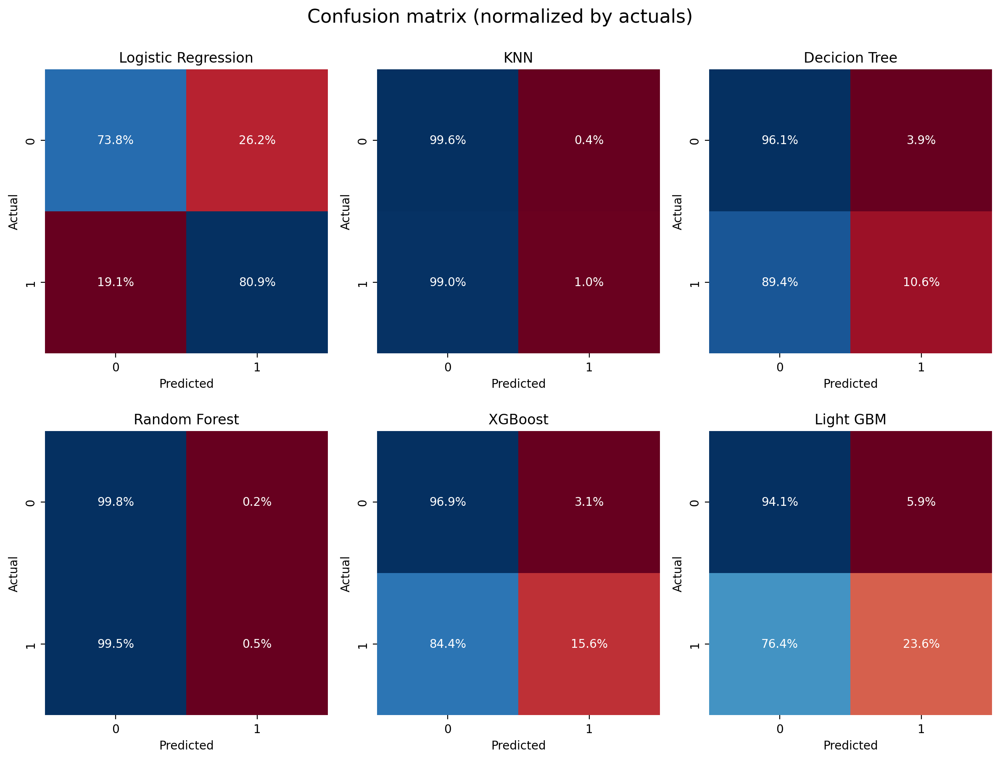

In [21]:
plot_cm_comparison(
    classifiers_stroke, preprocessor_stroke, X_stroke_train, y_stroke_train
)

**Insights**

- Before hyperparameter tuning logistic regression seems to be able to predict class 1 more accurately than ensemble algorithms.
- Based on macro F1-score and recall score (and project requirements to use ensemble algorithms) 3 following classifiers are chosen for hyperparameter tuning and analysis:
    - Logistic regression
    - XGBoost
    - LightGBM

### Logistic Regression

In [22]:
log_reg_pipe = ImPipeline(
    steps=[
        ("preprocessor", preprocessor_stroke),
        ("balancer", RandomOverSampler()),
        ("classifier", LogisticRegression(max_iter=10000)),
    ]
)

In [23]:
param_space = {
    "balancer": [
        RandomOverSampler(),
        SMOTE(),
        BorderlineSMOTE(),
        BorderlineSMOTE(sampling_strategy="minority"),
        SMOTETomek(),
    ],
    "classifier__C": [0.001, 0.05, 0.08, 0.1, 0.15, 1, 10, 100],
}

search_log = RandomizedSearchCV(
    log_reg_pipe,
    param_distributions=param_space,
    scoring="recall",
    cv=StratifiedKFold(n_splits=5, random_state=None),
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_stroke_train, y_stroke_train)

print(
    "\033[1m" + "Best parameters: " + "\033[0m" + "{}".format(search_log.best_params_)
)
print(
    "\033[1m"
    + "Best recall score: "
    + "\033[0m"
    + "{:0.3f}".format(search_log.best_score_)
)

Best parameters: {'classifier__C': 0.15, 'balancer': RandomOverSampler()}
Best recall score: 0.799


In [24]:
print("Before balancer --> ", Counter(y_stroke_train))
print(
    "After balancer --> ",
    Counter(
        search_log.best_estimator_[:-1].fit_resample(X_stroke_train, y_stroke_train)[1]
    ),
)

Before balancer -->  Counter({0: 3888, 1: 199})
After balancer -->  Counter({0: 3888, 1: 3888})


#### Training results

In [25]:
train_pred = search_log.predict(X_stroke_train)

print(
    "\033[1m" + "Classification report for Logistic Regression:\n\n" + "\033[0m",
    classification_report(
        y_stroke_train,
        train_pred,
    ),
)

Classification report for Logistic Regression:

               precision    recall  f1-score   support

           0       0.99      0.73      0.84      3888
           1       0.14      0.82      0.23       199

    accuracy                           0.74      4087
   macro avg       0.56      0.78      0.54      4087
weighted avg       0.95      0.74      0.81      4087



#### Model evaluation

In [26]:
pred_log = search_log.predict(X_stroke_test)
pred_log_proba = search_log.predict_proba(X_stroke_test)

In [27]:
print(
    "\033[1m" + "Classification report for Logistic Regression:\n\n" + "\033[0m",
    classification_report(
        y_stroke_test,
        pred_log,
    ),
)

Classification report for Logistic Regression:

               precision    recall  f1-score   support

           0       0.99      0.73      0.84       972
           1       0.13      0.82      0.23        50

    accuracy                           0.73      1022
   macro avg       0.56      0.77      0.53      1022
weighted avg       0.95      0.73      0.81      1022



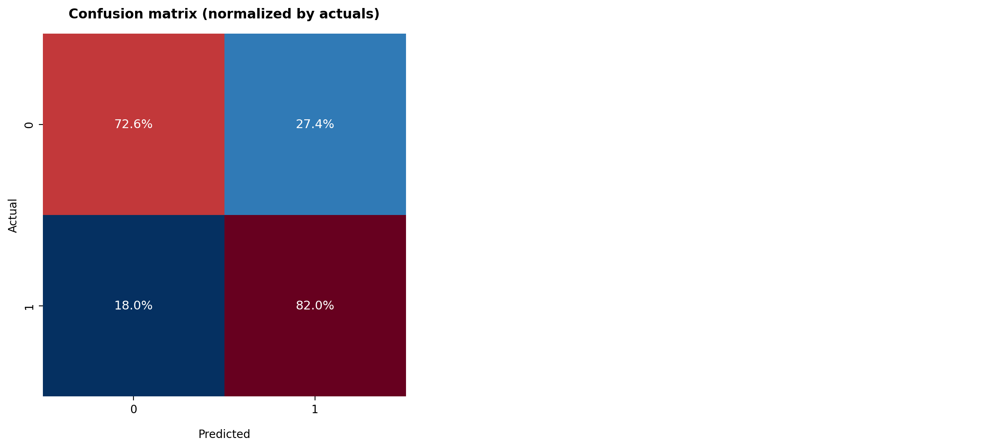

In [28]:
create_confusion(y_stroke_test, pred_log)

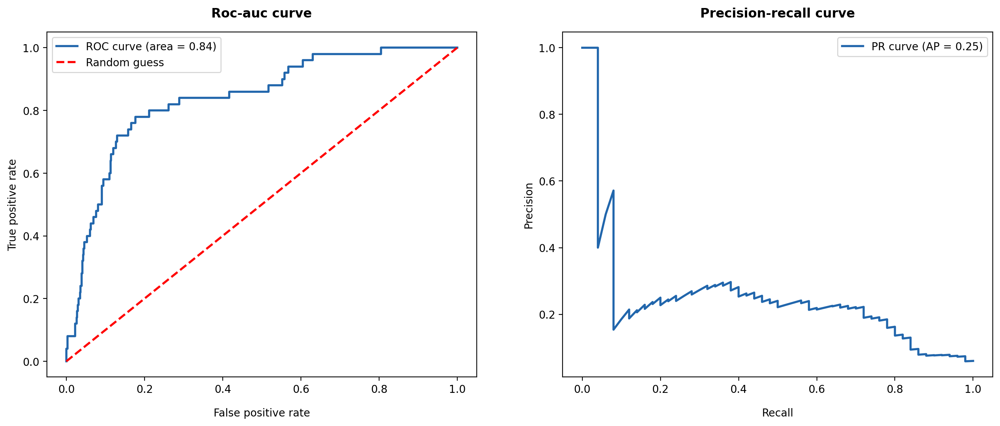

In [29]:
create_curves(y_stroke_test, pred_log_proba)

**Insights**

- Logistic regression provides very similar results on train and test sets: fairly high recall score for both classes but precision for class 1 is really low (quite many false positives).
- Roc-auc curve indicates a high model skill (above 0.8) to separate between classes which could create a false sense that model is performing really well in predicting both classes.
- Because classifiying positive class correctly is more important in stroke prediction than negative class, precision-recall curve provides more accurate image of classifier performance. AP (or area under PR curve) for logistic regression is really low showing poor model ability to maintain a good balance between precision and recall: the more accurate the model in predicting stroke cases, the more frequent misclassifications of non-stroke cases. And even though missclassification of negative class is less costly, some sort of precision is desirable for model to make sense.

#### Feature importance

In [30]:
feature_names = get_feature_names(search_log, 1, numeric_features)

In [31]:
X_stroke_train_tr = search_log.best_estimator_[0].transform(X_stroke_train)
X_stroke_test_tr = search_log.best_estimator_[0].transform(X_stroke_test)

explainer_log = shap.LinearExplainer(
    search_log.best_estimator_[-1],
    X_stroke_train_tr,
    feature_names=feature_names,
)
shap_values = explainer_log(X_stroke_test_tr)

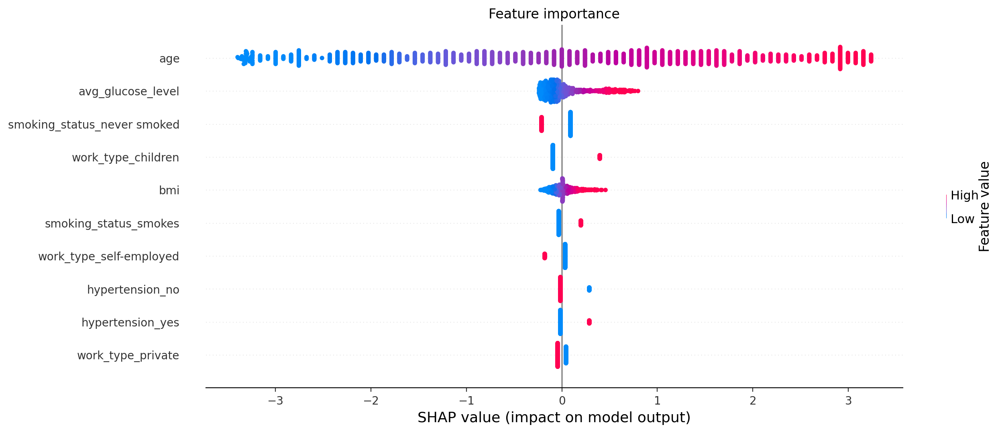

In [32]:
shap.summary_plot(
    shap_values,
    X_stroke_test_tr,
    feature_names=feature_names,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()

fig.set_size_inches(14, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

**Insights**

- 4 Most important features by logistic regression:
    - age
    - work_type (category 'children')
    - avg_glucose_level
    - smoking_status (category 'never_smoked')

#### Misclassified positive instances

In [33]:
misclassied_pos_log = X_stroke_test[(y_stroke_test == 1) & (pred_log == 0)]

misclassied_pos_log

,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,bmi,smoking_status
133,female,38.0,no,no,yes,private,rural,101.45,NaN,formerly smoked
94,male,45.0,no,no,yes,private,rural,64.14,29.4,never smoked
182,female,32.0,no,no,yes,private,rural,76.13,29.9,smokes
88,male,47.0,no,no,yes,private,urban,86.94,41.1,formerly smoked
210,female,39.0,no,no,yes,private,urban,83.24,26.3,never smoked
245,female,14.0,no,no,no,children,rural,57.93,30.9,unknown
31,male,42.0,no,no,yes,private,rural,83.41,25.4,unknown
38,male,58.0,no,no,no,private,rural,92.62,32.0,unknown
228,female,39.0,no,no,yes,self-employed,urban,97.76,29.6,smokes


In [34]:
patient_info_ml.groupby("stroke")["age"].mean().round(2)

stroke
0    41.97
1    67.73
Name: age, dtype: float64

In [35]:
patient_info_ml.groupby("stroke")["avg_glucose_level"].mean().round(2)

stroke
0    104.79
1    132.54
Name: avg_glucose_level, dtype: float64

In [36]:
patient_info_ml.groupby("stroke")["bmi"].mean().round(2)

stroke
0    28.82
1    30.47
Name: bmi, dtype: float64

**Example of feature importance for one observation**

In [37]:
data_to_predict = X_stroke_test.loc[38].to_frame().T

data_to_predict

,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,bmi,smoking_status
38,male,58.0,no,no,no,private,rural,92.62,32.0,unknown


In [38]:
ind = X_stroke_test.index.get_loc(X_stroke_test.loc[38].name)
shap.force_plot(
    explainer_log.expected_value,
    shap_values.values[ind, :],
    X_stroke_test_tr[ind, :],
    feature_names=feature_names,
    link="logit",
)

**Insights**

- Most of missclassified patients are younger than the average patient that experienced the stroke.
- Also avg glucose level for missclassified positive stroke cases is lower than the usual avg glucose level for patients that had a stroke.
- None of the missclassified patients have hypertension or heart disease.

#### Adjusting threshold

In [39]:
pred_log_adjusted = np.where(pred_log_proba[:, 1] > 0.2, 1, 0)

In [40]:
print(
    "\033[1m" + "Classification report for Logistic Regression:\n\n" + "\033[0m",
    classification_report(
        y_stroke_test,
        pred_log_adjusted,
    ),
)

Classification report for Logistic Regression:

               precision    recall  f1-score   support

           0       0.99      0.49      0.66       972
           1       0.08      0.86      0.15        50

    accuracy                           0.51      1022
   macro avg       0.53      0.68      0.40      1022
weighted avg       0.94      0.51      0.63      1022



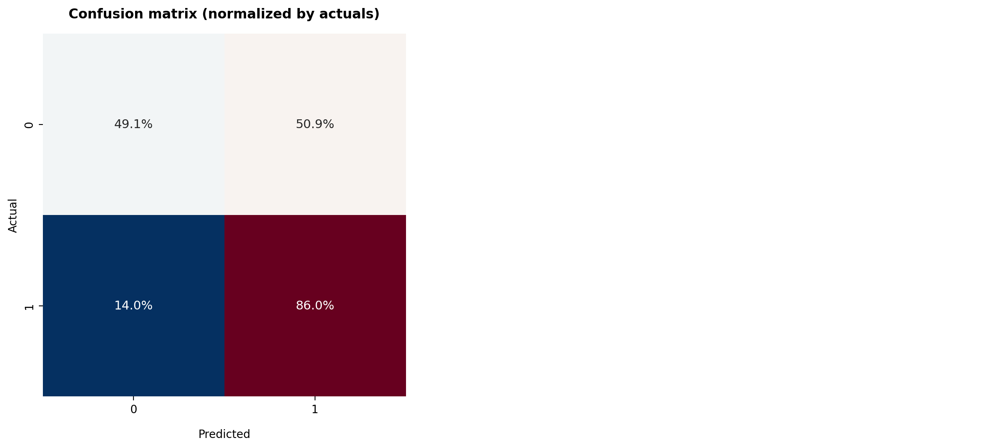

In [41]:
create_confusion(y_stroke_test, pred_log_adjusted)

**Insights**

- Adjusting classification threshold value to 0.2 provides a bit higher recall score for positive class. However more than have of negative class cases are predicted as positive class cases - precision drops to 0.08.
- I have tried adjusting threshold for all the classifiers in stroke and hypertension prediction and decided not to use it in this project as the gain in recall is low comparing with the loss in precision and I don't have enough knowledge to decide what is the acceptable threshold value.

In [42]:
# dataframe to track classifier results for comparison purposes
stroke_pred_eval = pd.DataFrame(
    columns=["Model", "Roc-auc", "F1-score", "Precision", "Recall"]
)

stroke_pred_eval = append_cls_metrics(
    stroke_pred_eval, y_stroke_test, pred_log, pred_log_proba, "Logistic_regression"
)

### XGBoost

In [43]:
xgboost_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor_stroke),
        (
            "classifier",
            xgb.XGBClassifier(
                objective="reg:logistic",
                use_label_encoder=False,
            ),
        ),
    ]
)

In [44]:
param_space = {
    "classifier__scale_pos_weight": list(range(10, 30)),
    "classifier__max_depth": list(range(2, 15)),
    "classifier__min_child_weight": list(range(1, 30)),
    "classifier__n_estimators": list(range(5, 500)),
    "classifier__learning_rate": [0.01, 0.05, 0.1, 0.2, 0.3],
    "classifier__subsample": [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    "classifier__gamma": [0, 0.25, 0.5, 1.0],
}

search_xgboost = RandomizedSearchCV(
    xgboost_pipe,
    param_distributions=param_space,
    scoring="recall",
    cv=StratifiedKFold(n_splits=5, random_state=None),
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_stroke_train, y_stroke_train)

print(
    "\033[1m"
    + "Best parameters: "
    + "\033[0m"
    + "{}".format(search_xgboost.best_params_)
)
print(
    "\033[1m"
    + "Best recall score: "
    + "\033[0m"
    + "{:0.3f}".format(search_xgboost.best_score_)
)

Best parameters: {'classifier__subsample': 0.7, 'classifier__scale_pos_weight': 20, 'classifier__n_estimators': 92, 'classifier__min_child_weight': 21, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.05, 'classifier__gamma': 0.5}
Best recall score: 0.749


In [45]:
# joblib.dump(search_xgboost.best_estimator_, "models/stroke_classifier.pkl")

#### Training results

In [46]:
train_pred = search_xgboost.predict(X_stroke_train)

print(
    "\033[1m" + "Classification report for train set with XGBoost:\n\n" + "\033[0m",
    classification_report(
        y_stroke_train,
        train_pred,
    ),
)

Classification report for train set with XGBoost:

               precision    recall  f1-score   support

           0       1.00      0.76      0.86      3888
           1       0.17      0.93      0.29       199

    accuracy                           0.77      4087
   macro avg       0.58      0.85      0.57      4087
weighted avg       0.96      0.77      0.84      4087



#### Model evaluation

In [47]:
pred_xgboost = search_xgboost.predict(X_stroke_test)
pred_xgboost_proba = search_xgboost.predict_proba(X_stroke_test)

In [48]:
print(
    "\033[1m" + "Classification report for test set with XGBoost:\n\n" + "\033[0m",
    classification_report(
        y_stroke_test,
        pred_xgboost,
    ),
)

Classification report for test set with XGBoost:

               precision    recall  f1-score   support

           0       0.99      0.75      0.85       972
           1       0.14      0.82      0.25        50

    accuracy                           0.75      1022
   macro avg       0.57      0.79      0.55      1022
weighted avg       0.95      0.75      0.82      1022



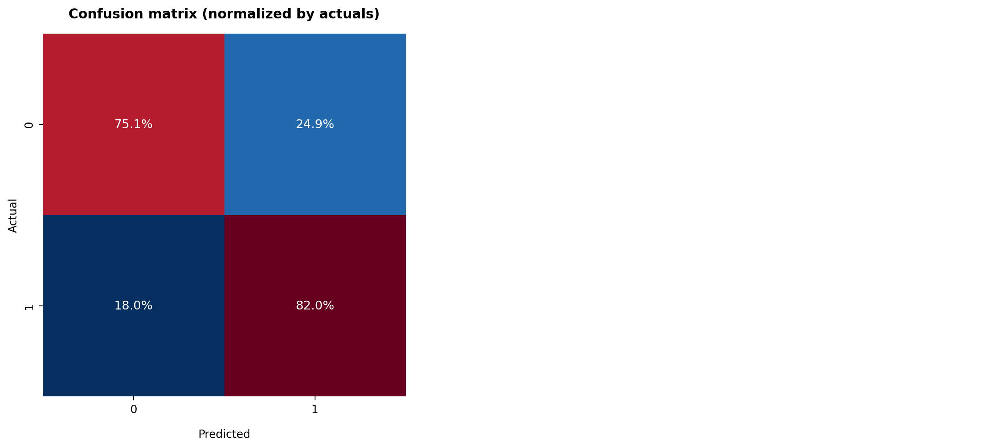

In [49]:
create_confusion(y_stroke_test, pred_xgboost)

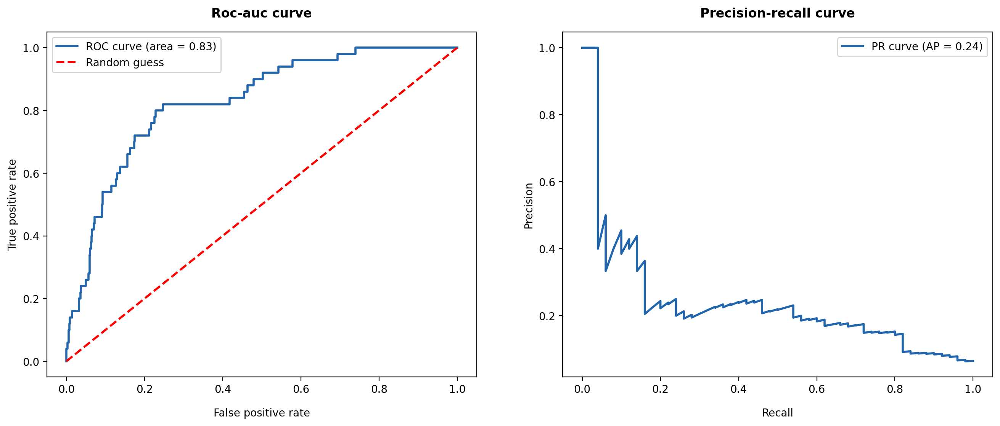

In [50]:
create_curves(y_stroke_test, pred_xgboost_proba)

**Insigths**

- XGBoost after hyperparameter tuning provides a very slight improvement comparing with logistic regression results: quite high recall score for both classes but precision for class 1 is really low (quite many false positives).
- Roc-auc curve indicates a high model skill (above 0.8) to separate between classes. However AP (area under PR curve) is really low showing poor model ability to maintain a good balance between precision and recall: the more accurate the model in predicting stroke cases, the more frequent misclassifications of non-stroke cases. 

#### Feature importance

In [51]:
explainer = shap.TreeExplainer(search_xgboost.best_estimator_[-1])
shap_values = explainer.shap_values(X_stroke_test_tr)

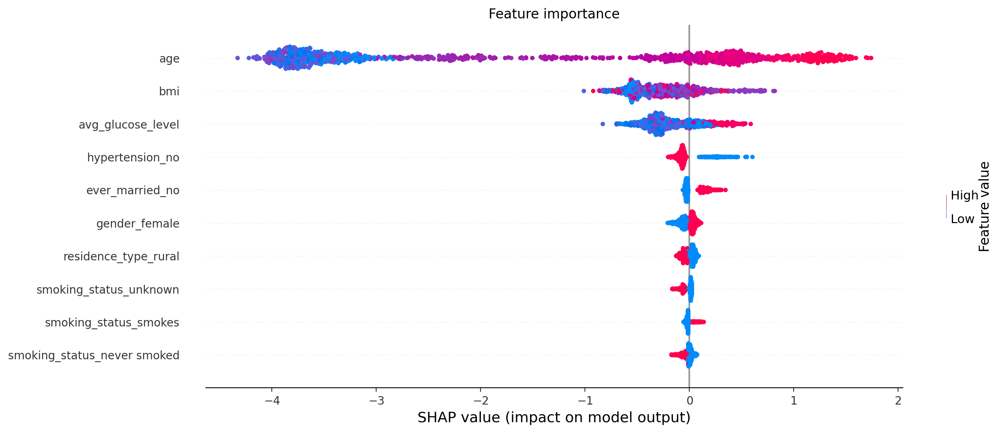

In [52]:
shap.summary_plot(
    shap_values,
    X_stroke_test_tr,
    feature_names=feature_names,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()

fig.set_size_inches(14, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

**Insights**

- Feature importance is a bit different than what was provided by logistic regression, seems that continuous variables provides more power to prediction by XGBoost. 
- 4 Most important features by XGBoost:
    - age
    - bmi
    - avg_glucose_level
    - hypertesnion (category 'no')

#### Misclassified positive instances

In [53]:
misclassied_pos_xgboost = X_stroke_test[(y_stroke_test == 1) & (pred_xgboost == 0)]

misclassied_pos_xgboost

,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,bmi,smoking_status
133,female,38.0,no,no,yes,private,rural,101.45,NaN,formerly smoked
94,male,45.0,no,no,yes,private,rural,64.14,29.4,never smoked
182,female,32.0,no,no,yes,private,rural,76.13,29.9,smokes
88,male,47.0,no,no,yes,private,urban,86.94,41.1,formerly smoked
80,male,59.0,no,no,yes,private,rural,96.16,44.1,unknown
210,female,39.0,no,no,yes,private,urban,83.24,26.3,never smoked
245,female,14.0,no,no,no,children,rural,57.93,30.9,unknown
31,male,42.0,no,no,yes,private,rural,83.41,25.4,unknown
228,female,39.0,no,no,yes,self-employed,urban,97.76,29.6,smokes


**Insights**

- Misclassified cases overlaps with missclassifed cases by logistic regression with few exceptions.

In [54]:
stroke_pred_eval = append_cls_metrics(
    stroke_pred_eval, y_stroke_test, pred_xgboost, pred_xgboost_proba, "XGBoost"
)

### Light GBM

In [55]:
light_gbm_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor_stroke),
        (
            "classifier",
            lgb.LGBMClassifier(
                objective="binary",
                metrics="auc",
                scale_pos_weight=pos_weight,
                verbosity=-1,
            ),
        ),
    ]
)

In [56]:
param_space = {
    "classifier__max_depth": list(range(2, 13)),
    "classifier__num_leaves": list(range(4, 300)),
    "classifier__min_data_in_leaf": list(range(5, 100)),
    "classifier__min_child_weight": list(range(1, 10)),
    "classifier__n_estimators": list(range(5, 500)),
    "classifier__learning_rate": [0.01, 0.1, 0.2, 0.3],
    "classifier__lambda_l1": [0, 0.01, 1, 2, 5, 7, 10, 50, 100],
}

search_light = RandomizedSearchCV(
    light_gbm_pipe,
    param_distributions=param_space,
    scoring="recall",
    cv=StratifiedKFold(n_splits=5, random_state=None),
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_stroke_train, y_stroke_train)

print(
    "\033[1m" + "Best parameters: " + "\033[0m" + "{}".format(search_light.best_params_)
)
print(
    "\033[1m"
    + "Best recall score: "
    + "\033[0m"
    + "{:0.3f}".format(search_light.best_score_)
)

[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
Best parameters: {'classifier__num_leaves': 54, 'classifier__n_estimators': 429, 'classifier__min_data_in_leaf': 33, 'classifier__min_child_weight': 6, 'classifier__max_depth': 8, 'classifier__learning_rate': 0.01, 'classifier__lambda_l1': 100}
Best recall score: 0.864


#### Training results

In [57]:
train_pred = search_light.predict(X_stroke_train)

print(
    "\033[1m" + "Classification report for train set with LightGBM:\n\n" + "\033[0m",
    classification_report(
        y_stroke_train,
        train_pred,
    ),
)

Classification report for train set with LightGBM:

               precision    recall  f1-score   support

           0       0.99      0.69      0.81      3888
           1       0.13      0.90      0.22       199

    accuracy                           0.70      4087
   macro avg       0.56      0.79      0.52      4087
weighted avg       0.95      0.70      0.78      4087



#### Model evaluation

In [58]:
pred_light = search_light.predict(X_stroke_test)
pred_light_proba = search_light.predict_proba(X_stroke_test)

In [59]:
print(
    "\033[1m" + "Classification report for test set with LightGBM:\n\n" + "\033[0m",
    classification_report(
        y_stroke_test,
        pred_light,
    ),
)

Classification report for test set with LightGBM:

               precision    recall  f1-score   support

           0       0.99      0.68      0.80       972
           1       0.12      0.82      0.20        50

    accuracy                           0.68      1022
   macro avg       0.55      0.75      0.50      1022
weighted avg       0.94      0.68      0.77      1022



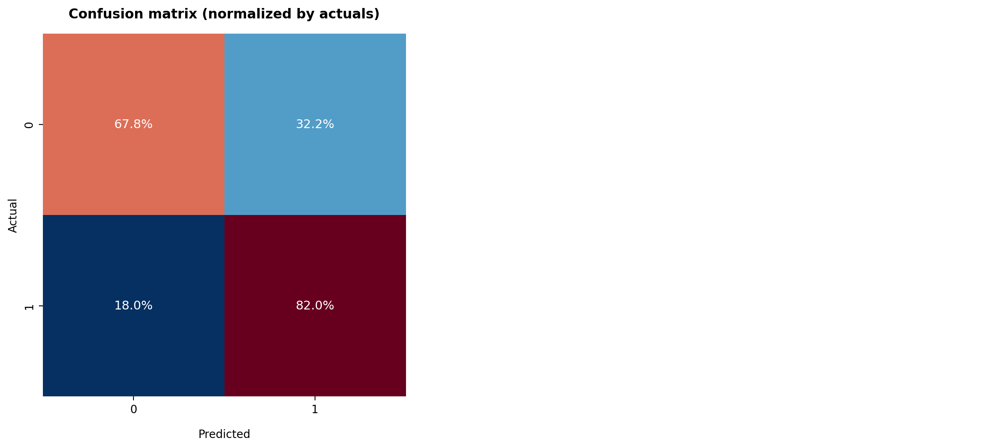

In [60]:
create_confusion(y_stroke_test, pred_light)

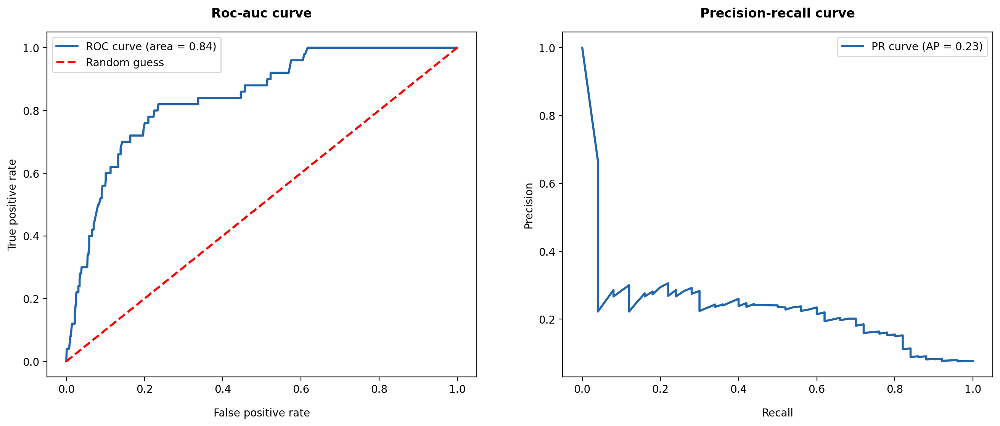

In [61]:
create_curves(y_stroke_test, pred_light_proba)

**Insigths**

- LightGBM after hyperparameter tuning provides very similar results to XGBoost: quite high recall score for both classes but precision for class 1 is really low (quite many false positives). Worth mentioning that F1-score is a bit lower than XGBoost F1-socre.
- Roc-auc curve indicates a quite high model skill (above 0.8) to distinguish between classes. However AP (area under PR curve) is really low showing that the more accurate the model in predicting patients that are likely to suffer a stroke, the more frequent are false positives.

#### Feature importance

In [62]:
explainer = shap.TreeExplainer(search_light.best_estimator_[-1])
shap_values = explainer.shap_values(X_stroke_test_tr)

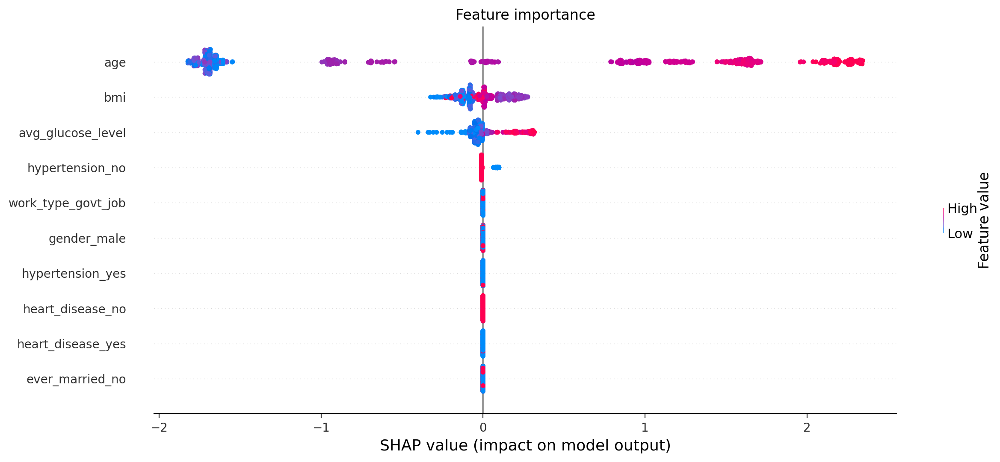

In [63]:
shap.summary_plot(
    shap_values[1],
    X_stroke_test_tr,
    feature_names=feature_names,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()
fig.set_size_inches(14, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

**Insights**

- LightGBM feature importance is very similar to XGBoost feature importance.
- 4 Most important features by LightGBM:
    - age
    - bmi
    - avg_glucose_level
    - hypertesnion (category 'no')

#### Misclassified positive instances

In [64]:
misclassied_pos_light = X_stroke_test[(y_stroke_test == 1) & (pred_light == 0)]

misclassied_pos_light

,gender,age,hypertension,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,bmi,smoking_status
133,female,38.0,no,no,yes,private,rural,101.45,NaN,formerly smoked
94,male,45.0,no,no,yes,private,rural,64.14,29.4,never smoked
182,female,32.0,no,no,yes,private,rural,76.13,29.9,smokes
88,male,47.0,no,no,yes,private,urban,86.94,41.1,formerly smoked
80,male,59.0,no,no,yes,private,rural,96.16,44.1,unknown
210,female,39.0,no,no,yes,private,urban,83.24,26.3,never smoked
245,female,14.0,no,no,no,children,rural,57.93,30.9,unknown
31,male,42.0,no,no,yes,private,rural,83.41,25.4,unknown
228,female,39.0,no,no,yes,self-employed,urban,97.76,29.6,smokes


In [65]:
stroke_pred_eval = append_cls_metrics(
    stroke_pred_eval, y_stroke_test, pred_light, pred_light_proba, "LightGBM"
)

### Stroke prediction summary

Comparing metrics of 3 differenct classifiers on test set:

In [66]:
stroke_pred_eval.set_index("Model").round(3)

,Roc-auc,F1-score,Precision,Recall
Model,,,,
Logistic_regression,0.839,0.533,0.134,0.82
XGBoost,0.829,0.550,0.145,0.82
LightGBM,0.841,0.503,0.116,0.82


**Insights**

- Results of all three classifiers (after hyperparameter tuning) are very similar. It might be the case that small dataset limits the usability of the advantages of the ensemble models.
- I chose XGBoost for deployment as it provides a slightly higher recall and precision than other models.

***

## Hypertension prediction

**Approach**

- I chose recall as the main metric for model evaluation in hypertension prediction because, in my opinion, correctly identifying patients that are likely to have hypertension is more important than correctly identifying hypertension-free patients. In other words False negatives are more costly than false positives.
- Even though missclassification of negative class is less costly, some sort of precision is desirable for model to make sense, therefore precision for positive class and avg macro F1-score is revised for each classifier as well. (Macro f1-score is low for models that only perform well on the common classes while performing poorly on the rare classes.)
- Additionally, feature importance is checked to understand what features have the greatest impact on predictions and whether they are consistent with EDA findings.

**Note:**   
Notation used in classification report and confusion matrix:  
- Class 0 - hypertension-free patient 
- Class 1 - hypertensive patient

### Preprocessing

In [67]:
patient_info_h_ml = patient_info_ml.drop(columns="stroke")

In [68]:
patient_info_h_ml["hypertension"] = patient_info_h_ml["hypertension"].map(
    {"yes": 1, "no": 0}
)

In [69]:
y_hyper = patient_info_h_ml["hypertension"]
X_hyper = patient_info_h_ml.drop(["hypertension"], axis=1)

In [70]:
X_hyper_train, X_hyper_test, y_hyper_train, y_hyper_test = train_test_split(
    X_hyper, y_hyper, test_size=0.2, stratify=y_hyper, random_state=RANDOM
)

In [71]:
y_hyper_train.value_counts()

0    3689
1     398
Name: hypertension, dtype: int64

In [72]:
y_hyper_test.value_counts()

0    922
1    100
Name: hypertension, dtype: int64

In [73]:
numeric_features_h = ['age', 'avg_glucose_level', 'bmi']
categorical_features_h = ['gender', 'heart_disease', 'ever_married', 'work_type', 'residence_type', 'smoking_status']

In [74]:
categorical_transformer = Pipeline(steps=[("encoder", OneHotEncoder())])
numeric_transformer = Pipeline(
    steps=[
        ("imputer", IterativeImputer(max_iter=10)),
        ("scaler", StandardScaler()),
    ]
)

preprocessor_hyper = ColumnTransformer(
    transformers=[
        ("categorical", categorical_transformer, categorical_features_h),
        ("numeric", numeric_transformer, numeric_features_h),
    ]
)

### Model selection

- To get a sense of how chosen classifiers perform on unseen data, I use Kfold CV to partition the data into many training and test samples and measure out-of-sample key metrics: f1-score, roc-auc, precision and recall.
- Basic balancing techniques are applied to get a better understanding on model performance and ability to classify positive class correctly.

In [75]:
pos_weight_h = sum(y_hyper_train == 0) / sum(y_hyper_train == 1)

In [76]:
classifiers_hyper = [
    ("Logistic Regression", LogisticRegression(class_weight="balanced", max_iter=1000)),
    ("KNN", KNeighborsClassifier()),
    ("Decicion Tree", DecisionTreeClassifier(class_weight="balanced")),
    ("Random Forest", RandomForestClassifier(class_weight="balanced")),
    (
        "XGBoost",
        xgb.XGBClassifier(
            objective="reg:logistic",
            use_label_encoder=False,
            scale_pos_weight=pos_weight_h,
        ),
    ),
    ("Light GBM", lgb.LGBMClassifier(scale_pos_weight=pos_weight_h, verbosity=-1)),
]

In [77]:
cls_comparison = compare_classifiers(
    classifiers_hyper, preprocessor_hyper, X_hyper_train, y_hyper_train
)
cls_comparison = cls_comparison.set_index("Classifier")

cls_comparison.style.format("{0:,.3f}").apply(
    highlight_max, num_to_highlight=3, subset=["Recall"]
)

,Fit_time,Roc_auc,F1-score,Precision,Recall
Classifier,,,,,
Logistic Regression,0.064,0.814,0.571,0.214,0.787
KNN,0.023,0.695,0.532,0.248,0.086
Decicion Tree,0.031,0.546,0.547,0.186,0.176
Random Forest,0.313,0.782,0.511,0.325,0.043
XGBoost,0.311,0.758,0.571,0.223,0.234
Light GBM,0.092,0.774,0.589,0.227,0.395


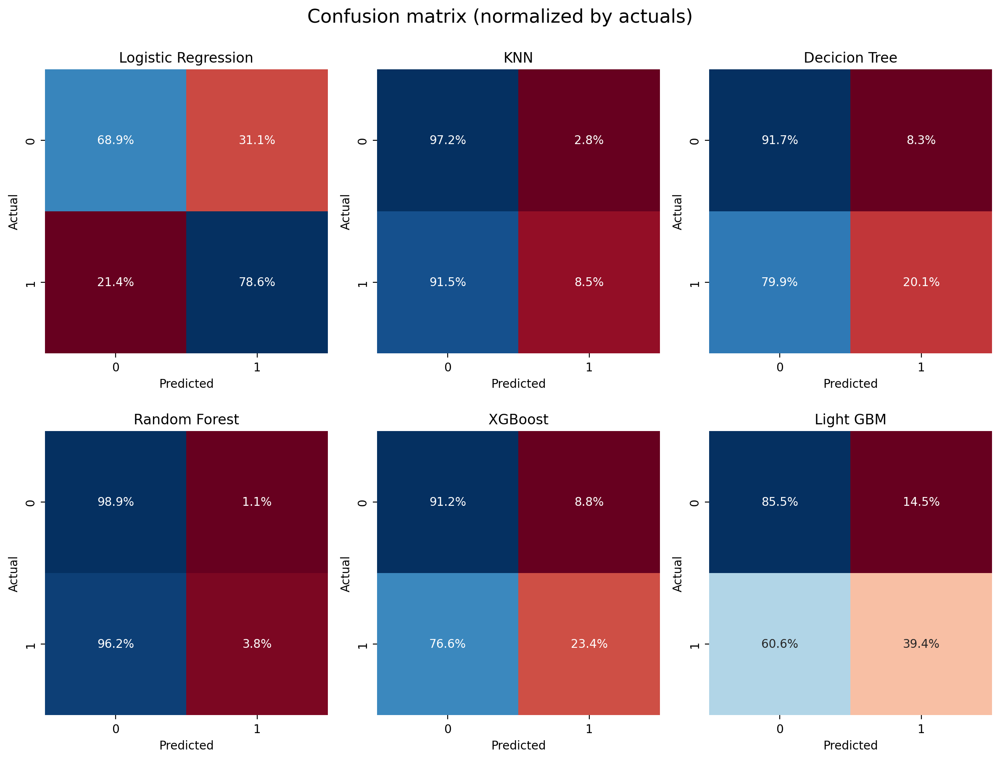

In [78]:
plot_cm_comparison(classifiers_hyper, preprocessor_hyper, X_hyper_train, y_hyper_train)

**Insights**

- Before hyperparameter tuning logistic regression seems to be able to predict class 1 more accurately than ensemble algorithms. 
- Based on macro F1-score and recall score (and project requirements to practise ML with ensemble algorithms) 3 following classifiers are chosen for hyperparameter tuning and analysis:
    - Logistic regression
    - XGBoost
    - LightGBM

### Logistic Regression

In [79]:
log_reg_pipe = ImPipeline(
    steps=[
        ("preprocessor", preprocessor_hyper),
        ("balancer", RandomOverSampler()),
        ("classifier", LogisticRegression(max_iter=10000)),
    ]
)

In [80]:
param_space = {
    "balancer": [
        RandomOverSampler(),
        SMOTE(),
        BorderlineSMOTE(),
        BorderlineSMOTE(sampling_strategy="minority"),
        SMOTETomek(),
    ],
    "classifier__C": [0.001, 0.05, 0.08, 0.1, 0.15, 1, 10, 100],
}

search_log = RandomizedSearchCV(
    log_reg_pipe,
    param_distributions=param_space,
    scoring="recall",
    cv=StratifiedKFold(n_splits=5, random_state=None),
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_hyper_train, y_hyper_train)

print(
    "\033[1m" + "Best parameters: " + "\033[0m" + "{}".format(search_log.best_params_)
)
print(
    "\033[1m"
    + "Best roc_auc score: "
    + "\033[0m"
    + "{:0.3f}".format(search_log.best_score_)
)

Best parameters: {'classifier__C': 10, 'balancer': RandomOverSampler()}
Best roc_auc score: 0.789


#### Training results

In [81]:
train_pred = search_log.predict(X_hyper_train)

print(
    "\033[1m" + "Classification report for Logistic Regression:\n\n" + "\033[0m",
    classification_report(
        y_hyper_train,
        train_pred,
    ),
)

Classification report for Logistic Regression:

               precision    recall  f1-score   support

           0       0.97      0.69      0.80      3689
           1       0.22      0.80      0.34       398

    accuracy                           0.70      4087
   macro avg       0.59      0.74      0.57      4087
weighted avg       0.90      0.70      0.76      4087



#### Model evaluation

In [82]:
pred_log = search_log.predict(X_hyper_test)
pred_log_proba = search_log.predict_proba(X_hyper_test)

In [83]:
print(
    "\033[1m" + "Classification report for Logistic Regression:\n\n" + "\033[0m",
    classification_report(
        y_hyper_test,
        pred_log,
    ),
)

Classification report for Logistic Regression:

               precision    recall  f1-score   support

           0       0.97      0.67      0.79       922
           1       0.21      0.79      0.33       100

    accuracy                           0.68      1022
   macro avg       0.59      0.73      0.56      1022
weighted avg       0.89      0.68      0.75      1022



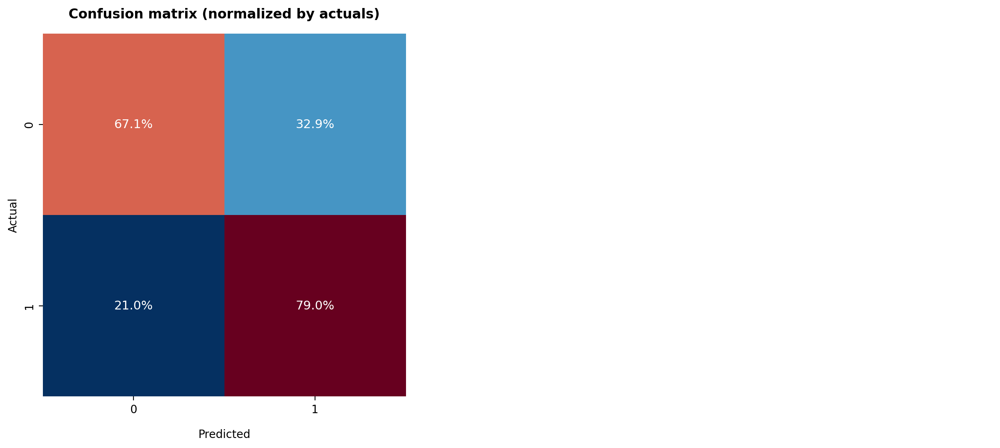

In [84]:
create_confusion(y_hyper_test, pred_log)

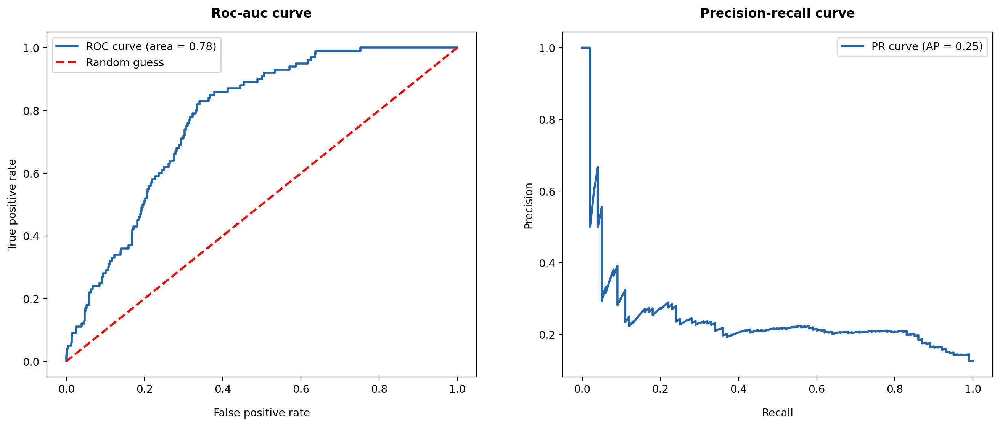

In [85]:
create_curves(y_hyper_test, pred_log_proba)

**Insights**

- Logistic regression provides very similar results on train and test sets: fairly high recall score for both classes but precision for class 1 is really low (quite many false positives).
- Roc-auc curve indicates a good model skill (above 0.75) to separate between classes which could create a false sense that model is performing really well in predicting both classes.
- Because classifiying positive class correctly is more important in hypertension prediction than negative class, precision-recall curve provides more accurate image of classifier performance. AP (or area under PR curve) for logistic regression is really low showing poor model ability to maintain a good balance between precision and recall: the more accurate the model in predicting hypertension cases, the more frequent misclassifications of non-hypertension cases. And even though missclassification of negative class is less costly, some sort of precision is desirable for model to make sense.


#### Feature importance

In [86]:
feature_names_h = get_feature_names(search_log, 1, numeric_features_h)

In [87]:
X_hyper_train_tr = search_log.best_estimator_[0].transform(X_hyper_train)
X_hyper_test_tr = search_log.best_estimator_[0].transform(X_hyper_test)

explainer_log = shap.LinearExplainer(
    search_log.best_estimator_[-1],
    X_hyper_train_tr,
    feature_names=feature_names_h,
)
shap_values = explainer_log(X_hyper_test_tr)

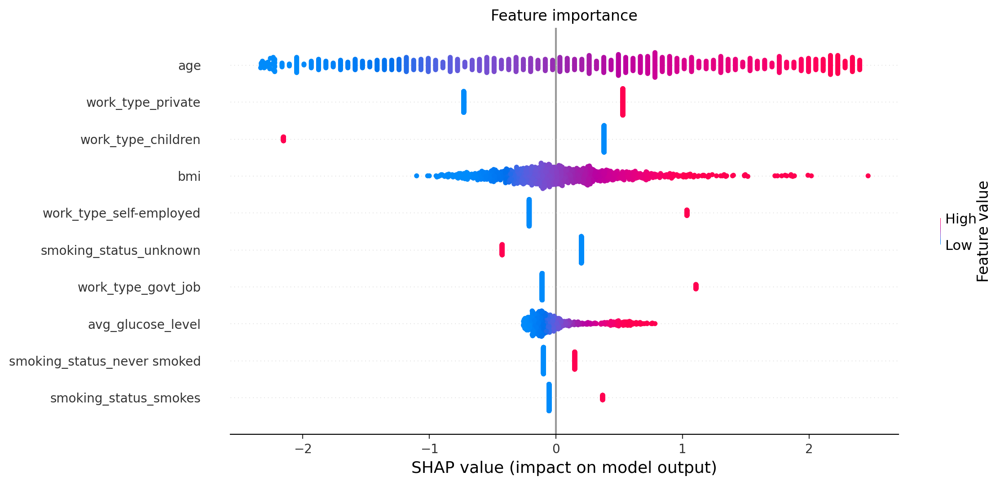

In [88]:
shap.summary_plot(
    shap_values,
    X_hyper_test_tr,
    feature_names=feature_names_h,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()
fig.set_size_inches(12, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

**Insights**

- Primary 4 risk factors for hypertension by logistic regression:
    - age
    - work_type (category 'children')
    - work_type (category 'private')
    - bmi

#### Missclassified positive instances

In [89]:
misclassied_pos_log = X_hyper_test[(y_hyper_test == 1) & (pred_log == 0)]

misclassied_pos_log.sample(10)

,gender,age,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,bmi,smoking_status
3485,male,39.0,no,yes,self-employed,urban,71.66,28.7,never smoked
1904,male,39.0,no,no,private,urban,80.99,39.8,unknown
1116,female,56.0,no,yes,govt_job,urban,82.44,27.8,smokes
2477,female,34.0,no,yes,self-employed,urban,100.61,NaN,unknown
3212,female,49.0,no,yes,govt_job,rural,63.16,23.3,formerly smoked
317,female,37.0,no,yes,self-employed,rural,127.71,36.0,never smoked
3890,male,45.0,no,yes,self-employed,rural,74.28,37.2,formerly smoked
2709,female,50.0,yes,no,govt_job,urban,79.79,25.6,smokes
680,male,31.0,no,yes,govt_job,urban,92.11,NaN,never smoked
1225,female,65.0,no,yes,private,urban,180.76,26.9,unknown


In [90]:
patient_info_ml.groupby("hypertension")["age"].mean()

hypertension
no     41.176318
yes    62.244980
Name: age, dtype: float64

In [91]:
patient_info_ml.groupby("hypertension")["avg_glucose_level"].mean()

hypertension
no     103.543088
yes    130.188996
Name: avg_glucose_level, dtype: float64

In [92]:
patient_info_ml.groupby("hypertension")["bmi"].mean()

hypertension
no     28.475432
yes    33.036585
Name: bmi, dtype: float64

**Insights**

- More than 20 cases (out of 100) was missclassified by logistic regression and it is difficult to find a pattern in missclassified positive cases.

In [93]:
# dataframe to track classifier results for comparison purposes
hypertension_pred_eval = pd.DataFrame(
    columns=["Model", "Roc-auc", "F1-score", "Precision", "Recall"]
)

hypertension_pred_eval = append_cls_metrics(
    hypertension_pred_eval,
    y_hyper_test,
    pred_log,
    pred_log_proba,
    "Logistic_regression",
)

### XGBoost

In [94]:
xgboost_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor_hyper),
        (
            "classifier",
            xgb.XGBClassifier(
                objective="reg:logistic",
                use_label_encoder=False,
            ),
        ),
    ]
)

In [95]:
param_space = {
    "classifier__scale_pos_weight": list(range(10, 30)),
    "classifier__max_depth": list(range(2, 15)),
    "classifier__min_child_weight": list(range(1, 30)),
    "classifier__n_estimators": list(range(5, 500)),
    "classifier__learning_rate": [0.01, 0.05, 0.1, 0.2, 0.3],
    "classifier__subsample": [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    "classifier__gamma": [0, 0.25, 0.5, 1.0],
}

search_xgboost_h = RandomizedSearchCV(
    xgboost_pipe,
    param_distributions=param_space,
    scoring="recall",
    cv=StratifiedKFold(n_splits=5, random_state=None),
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_hyper_train, y_hyper_train)

print(
    "\033[1m"
    + "Best parameters: "
    + "\033[0m"
    + "{}".format(search_xgboost_h.best_params_)
)
print(
    "\033[1m"
    + "Best recall score: "
    + "\033[0m"
    + "{:0.3f}".format(search_xgboost_h.best_score_)
)

Best parameters: {'classifier__subsample': 0.7, 'classifier__scale_pos_weight': 20, 'classifier__n_estimators': 92, 'classifier__min_child_weight': 21, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.05, 'classifier__gamma': 0.5}
Best recall score: 0.855


In [96]:
# joblib.dump(search_xgboost.best_estimator_, 'models/stroke_classifier.pkl')

#### Training results

In [97]:
train_pred = search_xgboost_h.predict(X_hyper_train)

print(
    "\033[1m" + "Classification report for train set with XGBoost:\n\n" + "\033[0m",
    classification_report(
        y_hyper_train,
        train_pred,
    ),
)

Classification report for train set with XGBoost:

               precision    recall  f1-score   support

           0       0.99      0.58      0.73      3689
           1       0.20      0.96      0.33       398

    accuracy                           0.62      4087
   macro avg       0.60      0.77      0.53      4087
weighted avg       0.92      0.62      0.69      4087



#### Model evaluation

In [98]:
pred_xgboost = search_xgboost_h.predict(X_hyper_test)
pred_xgboost_proba = search_xgboost_h.predict_proba(X_hyper_test)

In [99]:
print(
    "\033[1m" + "Classification report for test set with XGBoost:\n\n" + "\033[0m",
    classification_report(
        y_hyper_test,
        pred_xgboost,
    ),
)

Classification report for test set with XGBoost:

               precision    recall  f1-score   support

           0       0.98      0.58      0.73       922
           1       0.19      0.90      0.31       100

    accuracy                           0.61      1022
   macro avg       0.58      0.74      0.52      1022
weighted avg       0.90      0.61      0.69      1022



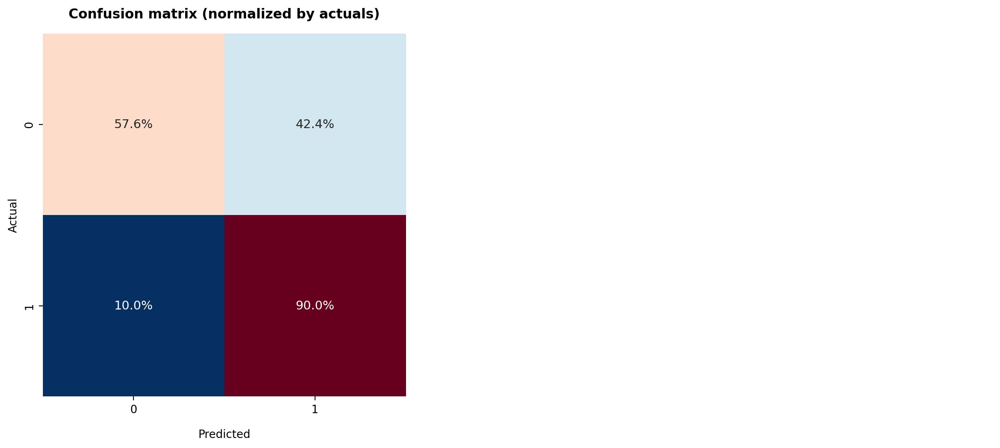

In [100]:
create_confusion(y_hyper_test, pred_xgboost)

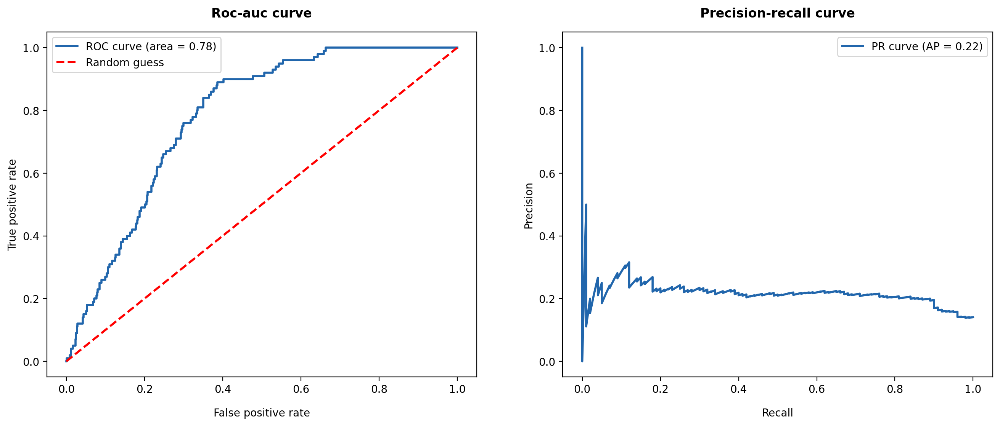

In [101]:
create_curves(y_hyper_test, pred_xgboost_proba)

**Insigths**

- XGBoost after hyperparameter tuning provides a visible improvement in recall for positive class. However the percentage of false pasitives increases - almost half of stroke-free patients are classified as stroke victims which puts model reliability into question.
- Roc-auc curve indicates a good model skill (above 0.75) to separate between classes. However AP (area under PR curve) is really low showing poor model ability to maintain a good balance between precision and recall.

#### Feature importance

In [102]:
explainer = shap.TreeExplainer(search_xgboost_h.best_estimator_[-1])
shap_values = explainer.shap_values(X_hyper_test_tr)

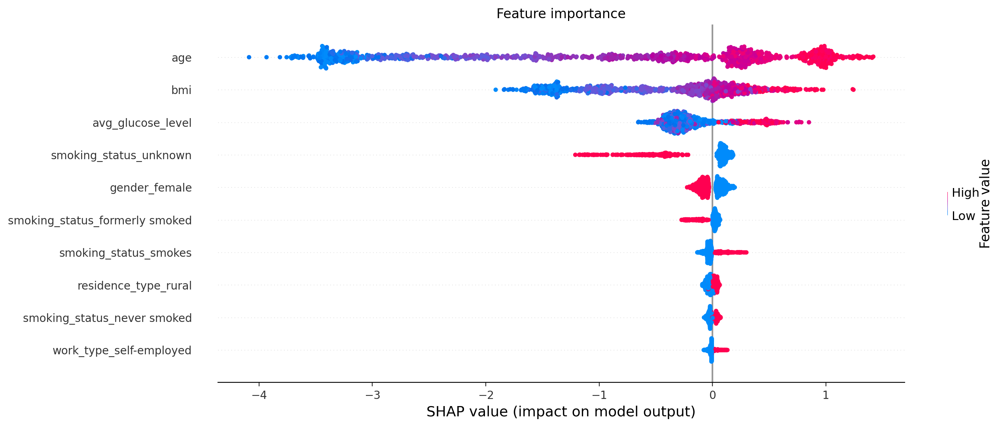

In [103]:
shap.summary_plot(
    shap_values,
    X_hyper_test_tr,
    feature_names=feature_names_h,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()

fig.set_size_inches(14, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

**Insights**

- Feature importance is a bit different than what was provided by logistic regression, seems that continuous variables provides more power to prediction by XGBoost. 
- 4 Most important features by XGBoost:
    - age
    - bmi
    - avg_glucose_level
    - smoking_status (category 'unknown')

#### Misclassified positive instances

In [104]:
misclassied_pos_xgboost = X_hyper_test[(y_hyper_test == 1) & (pred_xgboost == 0)]

misclassied_pos_xgboost

,gender,age,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,bmi,smoking_status
3212,female,49.0,no,yes,govt_job,rural,63.16,23.3,formerly smoked
2477,female,34.0,no,yes,self-employed,urban,100.61,NaN,unknown
4932,male,28.0,no,no,private,urban,86.61,38.6,smokes
3485,male,39.0,no,yes,self-employed,urban,71.66,28.7,never smoked
317,female,37.0,no,yes,self-employed,rural,127.71,36.0,never smoked
1490,female,49.0,no,yes,govt_job,rural,107.91,25.0,unknown
4320,male,44.0,no,yes,self-employed,rural,83.59,24.1,never smoked
3135,male,44.0,no,yes,private,rural,84.10,NaN,unknown
1554,female,22.0,no,no,private,urban,71.22,40.0,never smoked
680,male,31.0,no,yes,govt_job,urban,92.11,NaN,never smoked


**Insights**

- There is a clear pattern in XGBoost missclassified patients - they are younger than the average patient who has a hypertension.
- Also avg glucose level for missclassified positive hypertension cases is lower than the avg glucose level for patients that have a stroke.
- None of the missclassified patients have heart disease.

In [105]:
hypertension_pred_eval = append_cls_metrics(
    hypertension_pred_eval, y_hyper_test, pred_xgboost, pred_xgboost_proba, "XGBoost"
)

### LightGBM

In [106]:
light_gbm_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor_hyper),
        (
            "classifier",
            lgb.LGBMClassifier(
                objective="binary",
                scale_pos_weight=pos_weight_h,
                metric="recall",
                verbosity=-1,
            ),
        ),
    ]
)

In [107]:
param_space = {
    "classifier__max_depth": list(range(2, 13)),
    "classifier__num_leaves": list(range(4, 100)),
    "classifier__min_data_in_leaf": list(range(5, 300)),
    "classifier__min_child_weight": list(range(1, 10)),
    "classifier__n_estimators": list(range(5, 500)),
    "classifier__learning_rate": [0.01, 0.1, 0.2, 0.3],
    "classifier__lambda_l1": [0, 0.01, 1, 2, 5, 7, 10, 50, 100],
}

search_light_h = RandomizedSearchCV(
    light_gbm_pipe,
    param_distributions=param_space,
    scoring="recall",
    cv=StratifiedKFold(n_splits=5, random_state=None),
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_hyper_train, y_hyper_train)

print(
    "\033[1m"
    + "Best parameters: "
    + "\033[0m"
    + "{}".format(search_light_h.best_params_)
)
print(
    "\033[1m"
    + "Best roc_auc score: "
    + "\033[0m"
    + "{:0.3f}".format(search_light_h.best_score_)
)

[LightGBM] [Warning] min_data_in_leaf is set=208, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=208
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
Best parameters: {'classifier__num_leaves': 43, 'classifier__n_estimators': 181, 'classifier__min_data_in_leaf': 208, 'classifier__min_child_weight': 9, 'classifier__max_depth': 5, 'classifier__learning_rate': 0.1, 'classifier__lambda_l1': 100}
Best roc_auc score: 0.799


In [108]:
# joblib.dump(search_light_h.best_estimator_, 'models/hyper_classifier.pkl')

#### Training results

In [109]:
train_pred = search_light_h.predict(X_hyper_train)

print(
    "\033[1m" + "Classification report for train set with LightGBM:\n\n" + "\033[0m",
    classification_report(
        y_hyper_train,
        train_pred,
    ),
)

Classification report for train set with LightGBM:

               precision    recall  f1-score   support

           0       0.97      0.67      0.79      3689
           1       0.21      0.83      0.34       398

    accuracy                           0.68      4087
   macro avg       0.59      0.75      0.56      4087
weighted avg       0.90      0.68      0.75      4087



#### Model evaluation

In [110]:
pred_light = search_light_h.predict(X_hyper_test)
pred_light_proba = search_light_h.predict_proba(X_hyper_test)

In [111]:
print(
    "\033[1m" + "Classification report for test set with LightGBM:\n\n" + "\033[0m",
    classification_report(
        y_hyper_test,
        pred_light,
    ),
)

Classification report for test set with LightGBM:

               precision    recall  f1-score   support

           0       0.97      0.66      0.78       922
           1       0.21      0.84      0.33       100

    accuracy                           0.67      1022
   macro avg       0.59      0.75      0.56      1022
weighted avg       0.90      0.67      0.74      1022



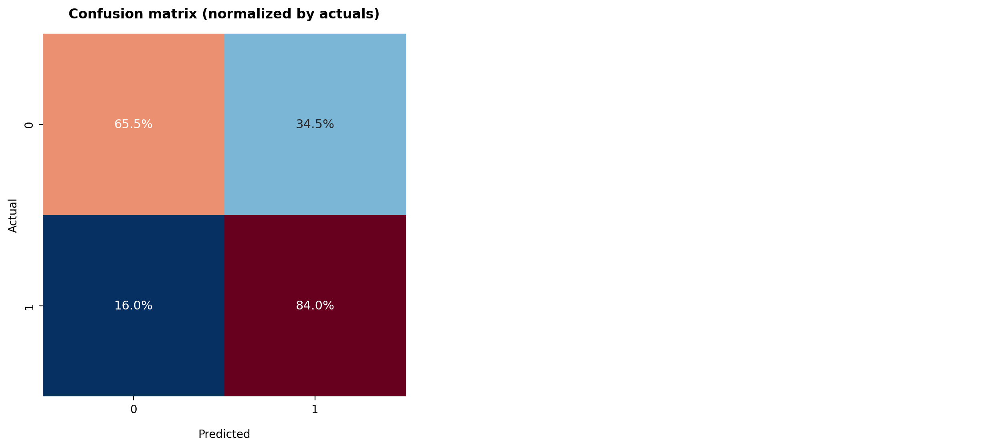

In [112]:
create_confusion(y_hyper_test, pred_light)

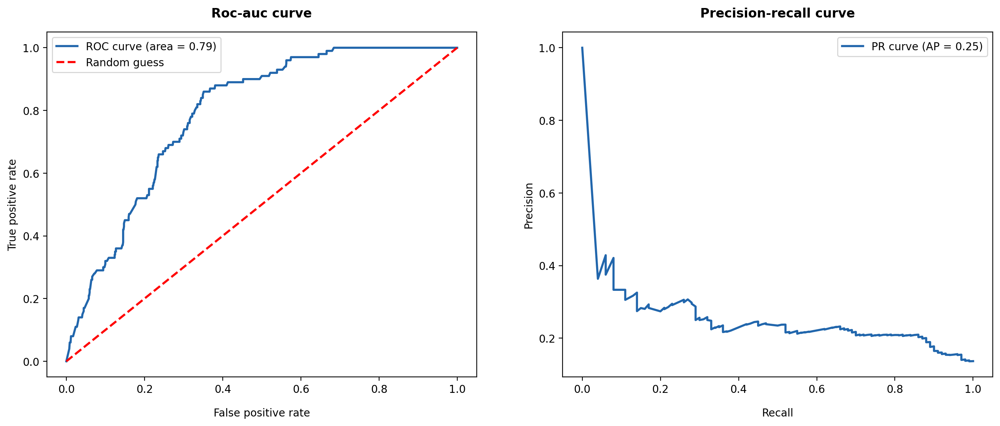

In [113]:
create_curves(y_hyper_test, pred_light_proba)

#### Feature importance

In [114]:
explainer = shap.TreeExplainer(search_light_h.best_estimator_[-1])
shap_values = explainer.shap_values(X_hyper_test_tr)

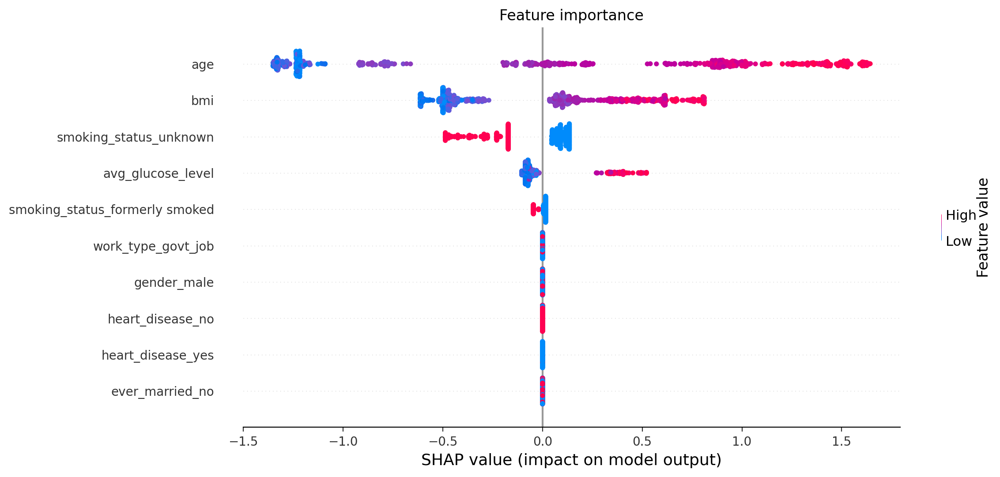

In [115]:
shap.summary_plot(
    shap_values[1],
    X_hyper_test_tr,
    feature_names=feature_names_h,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()
fig.set_size_inches(12, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

**Insights**

- LightGBM feature importance is very similar to XGBoost feature importance.
- 4 Most important features by LightGBM:
    - age
    - bmi
    - smoking status (category 'unknown')
    - avg_glucose_level

#### Misclassified positive instances

In [116]:
misclassied_pos_light = X_hyper_test[(y_hyper_test == 1) & (pred_light == 0)]

misclassied_pos_light

,gender,age,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,bmi,smoking_status
2709,female,50.0,yes,no,govt_job,urban,79.79,25.6,smokes
3212,female,49.0,no,yes,govt_job,rural,63.16,23.3,formerly smoked
2477,female,34.0,no,yes,self-employed,urban,100.61,NaN,unknown
1904,male,39.0,no,no,private,urban,80.99,39.8,unknown
4932,male,28.0,no,no,private,urban,86.61,38.6,smokes
3485,male,39.0,no,yes,self-employed,urban,71.66,28.7,never smoked
1188,male,62.0,no,yes,private,rural,77.92,26.7,never smoked
317,female,37.0,no,yes,self-employed,rural,127.71,36.0,never smoked
1490,female,49.0,no,yes,govt_job,rural,107.91,25.0,unknown
468,female,38.0,no,yes,private,urban,196.01,28.1,never smoked


**Example of feature importance for one observation**

In [117]:
data_to_predict = X_hyper_test.loc[1839].to_frame().T

data_to_predict

,gender,age,heart_disease,ever_married,work_type,residence_type,avg_glucose_level,bmi,smoking_status
1839,female,82.0,no,yes,self-employed,urban,77.32,24.8,unknown


In [118]:
search_light_h.predict(data_to_predict)

array([0])

In [119]:
ind = X_hyper_test.index.get_loc(X_hyper_test.loc[1839].name)
shap.force_plot(
    explainer.expected_value[1],
    shap_values[1][ind, :],
    pd.DataFrame(X_hyper_test_tr, columns=feature_names_h).iloc[ind, :],
    feature_names=feature_names_h,
    link="logit",
)

**Insights**

- As for XGBoost, most of missclassified positive patients by LightGBM are younger than the average patient who has a hypertension.
- Also avg glucose level and BMI for missclassified positive cases is lower (with few exceptions) than the average for hypertensive patients in this dataset.
- Analyzing feature importance for female over 80 y/o that was missclassified as stroke-free was discovered that category 'unknown' for smoking status has a high impact on pushing prediction towards negative class which is really interesting as this data relationship was not discovered in EDA phase.

In [120]:
hypertension_pred_eval = append_cls_metrics(
    hypertension_pred_eval, y_hyper_test, pred_light, pred_light_proba, "LightGBM"
)

### Hypertension prediction summary

Comparing metrics of 3 different classifiers on test set:

In [121]:
hypertension_pred_eval.set_index("Model").round(3)

,Roc-auc,F1-score,Precision,Recall
Model,,,,
Logistic_regression,0.776,0.560,0.207,0.79
XGBoost,0.781,0.518,0.187,0.90
LightGBM,0.789,0.559,0.209,0.84


**Insights**

- While XGBoost provides high recall score for positive class, F1 and precision scores are higher for LightGBM and Logistic regression.
- I decided to choose LightGBM for deployment as XGBoost provided really high number of false positives which raised some concerns about model reliability.

***

## Average glucose level prediction

**Approach**

- Avg glucose level prediction I treated as a regression problem and use two evaluation metrics:
    - R2 score - the proportion of the variance in the dependent variable that is predictable from the independent variable(s)
    - Root mean squared error (RMSE) - the standard deviation of the residuals (prediction errors)
- After some experimentation I found that age binning (grouping) improves avg glucose level prediction a bit (used custom transformer to fit this transformation into the pipeline)

### Preprocessing

In [123]:
y_glucose = patient_info_h_ml["avg_glucose_level"]
X_glucose = patient_info_h_ml.drop(["avg_glucose_level"], axis=1)

In [124]:
X_glc_train, X_glc_test, y_glc_train, y_glc_test = train_test_split(
    X_glucose, y_glucose, test_size=0.2, random_state=RANDOM
)

In [125]:
numeric_features_g = ['age', 'bmi']
categorical_features_g = ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'residence_type', 'smoking_status']

In [126]:
categorical_transformer = Pipeline(steps=[("encoder", OneHotEncoder())])

numeric_transformer = Pipeline(
    steps=[
        ("imputer", KNNImputer(n_neighbors=5)),
        ("scaler", StandardScaler()),
    ]
)


preprocessor_glucose = ColumnTransformer(
    transformers=[
        (
            "age_binner",
            AgeBinner(columns="age", encoder=OneHotEncoder(sparse=False)),
            ["age"],
        ),
        ("categorical", categorical_transformer, categorical_features_g),
        ("numeric", numeric_transformer, numeric_features_g),
    ]
)

### Model selection

In [127]:
regressors_glucose = [
    ("Dummy Regressor", DummyRegressor(strategy="mean")),
    ("Ridge", Ridge()),
    ("Decicion Tree", DecisionTreeRegressor()),
    ("Random Forest", RandomForestRegressor()),
    (
        "XGBoost",
        xgb.XGBRegressor(
            objective="reg:squarederror",
        ),
    ),
    ("Light GBM", lgb.LGBMRegressor(objective="regression", verbose=-1)),
]

In [128]:
rgss_comparison = compare_regressors(
    regressors_glucose, preprocessor_glucose, X_glc_train, y_glc_train
)
rgss_comparison = rgss_comparison.set_index("Regressor")

rgss_comparison.style.format("{0:,.3f}").apply(
    highlight_max, num_to_highlight=3, subset=["R-squared"]
)

,Fit_time,R-squared,RMSE
Regressor,,,
Dummy Regressor,0.055,-0.002,45.406
Linear Regression,0.037,0.095,43.160
Ridge,0.038,0.096,43.132
Decicion Tree,0.051,-0.798,60.711
Random Forest,1.057,0.004,45.254
XGBoost,0.413,-0.090,47.311
Light GBM,0.130,0.045,44.313


In [129]:
round(patient_info_ml["avg_glucose_level"].mean(), 2)

106.14

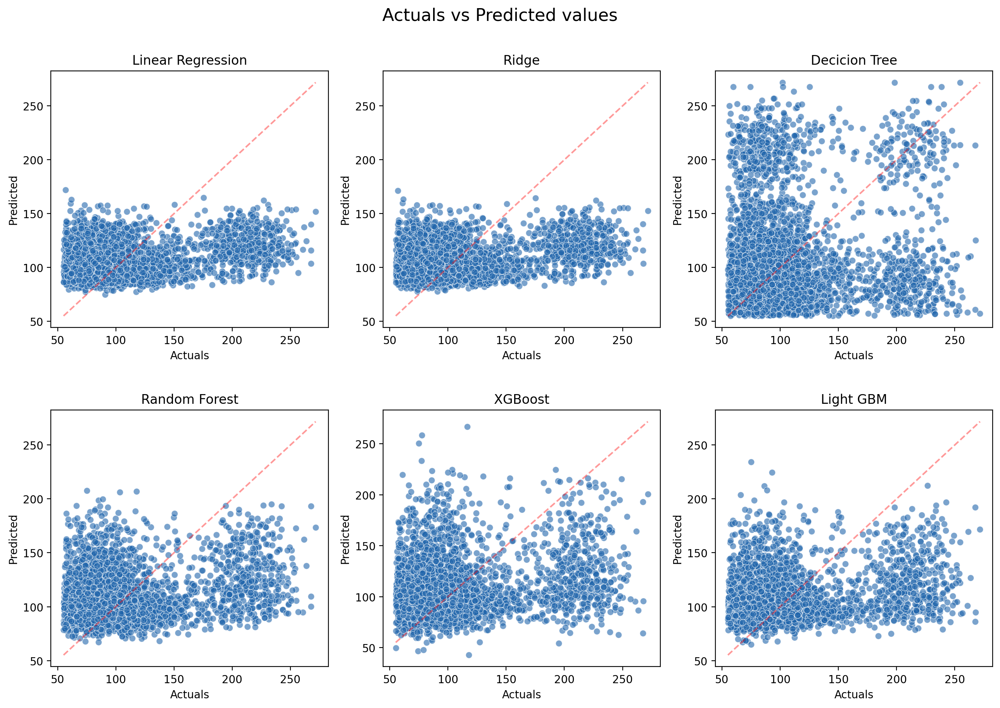

In [130]:
plot_reg_comparison(
    regressors_glucose, preprocessor_glucose, X_glc_train, y_glc_train
)

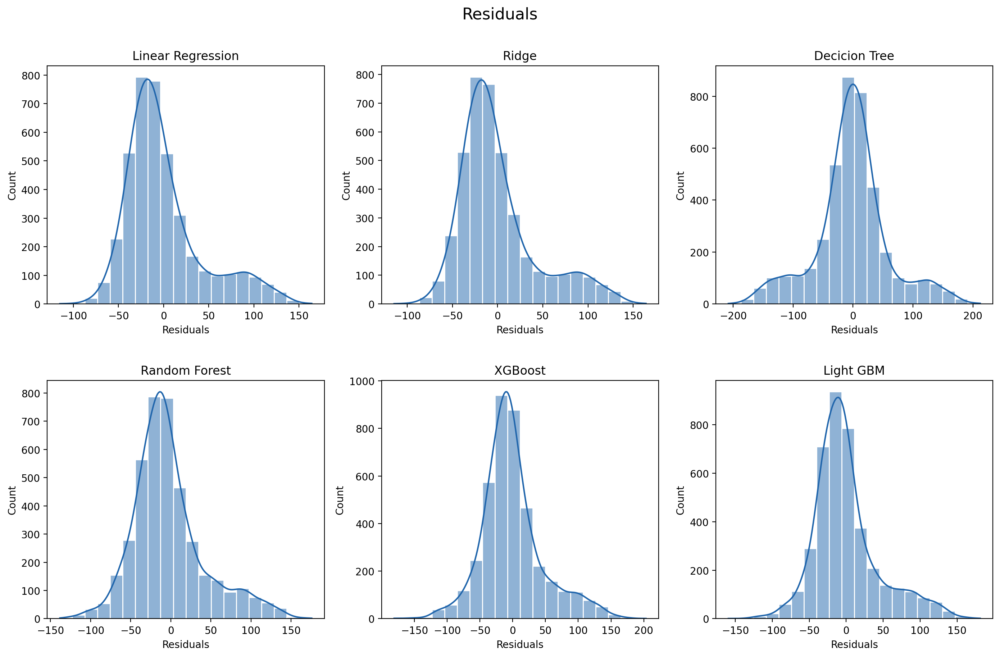

In [131]:
plot_residuals_comparison(
    regressors_glucose, preprocessor_glucose, X_glc_train, y_glc_train
)

**Insights**

- In general, it is obvious that features in this dataset are not sufficient for avg glucose level prediction. R2 score indicates that in most cases less than 10% of the variation in target could be explained by independent variables. Even thoguh resuls are low, I continued with hyperparameter tuning and model analysis as per project requirements.
- Comparing actuals vs predicted, expectation is that all points would be close to diagonal line (predicted close to actual value), but in most models predicted values are clustered around the mean of avg glucose level.
- Even though residual distribution for most models is roughly bell-shaped, the range of residuals are really high, creating RMSE around half of mean of avg glucose level.
- Before hyperparameter tuning Logistic Regression and Ridge provide the highest R2 score (and the lowest RMSE accordingly)
- For HP tuning phase I chose:
    - Ridge regression as it has a slightly lower RMSE than Logistic regression;
    - LightGBM as it provides the best results out of all used ensemble algorithms
    - XGBoost because after some experimentation with HP tuning it provided better results than Random Forest (even though Random Forest showed better results without HP tuning)

### Ridge

In [132]:
ridge_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor_glucose),
        ("regressor", Ridge()),
    ]
)

In [133]:
param_space = {
    "regressor__alpha": [0.001, 0.005, 0.01, 0.05, 0.1, 1.0, 10.0, 15, 100.0],
    "regressor__solver": ["auto", "svd", "cholesky", "sag", "saga", "lsqr", "lbfgs"],
}

search_ridge = RandomizedSearchCV(
    ridge_pipe,
    param_distributions=param_space,
    scoring="r2",
    cv=6,
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_glc_train, y_glc_train)

print(
    "\033[1m" + "Best parameters: " + "\033[0m" + "{}".format(search_ridge.best_params_)
)
print(
    "\033[1m"
    + "Best R-squared score: "
    + "\033[0m"
    + "{:0.3f}".format(search_ridge.best_score_)
)

Best parameters: {'regressor__solver': 'svd', 'regressor__alpha': 100.0}
Best R-squared score: 0.097


In [134]:
# joblib.dump(search_ridge.best_estimator_, "models/glucose_regressor.pkl")

In [135]:
glucose_pred = search_ridge.predict(X_glc_test)

In [136]:
print(f"R-squared score for test set: {search_ridge.score(X_glc_test, y_glc_test):.3f}")
print(
    f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_glc_test, glucose_pred)):.3f}"
)

R-squared score for test set: 0.077
Root Mean Squared Error: 42.964


#### Model evaluation

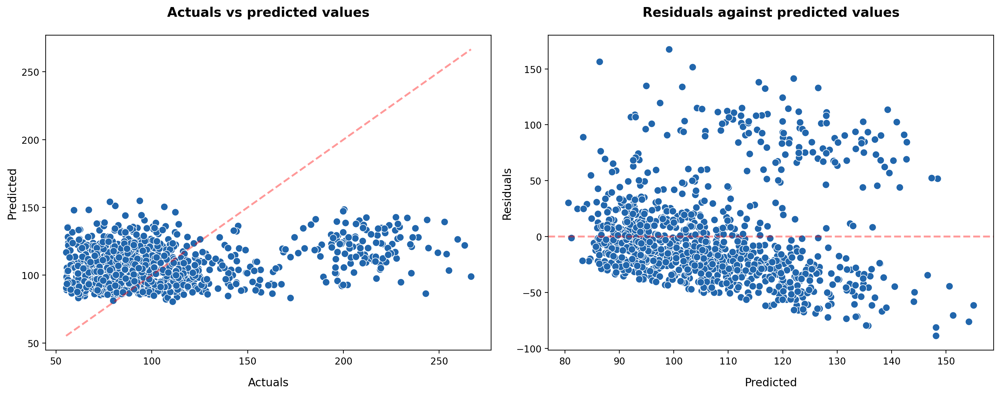

In [137]:
evaluate_model(y_glc_test, glucose_pred)

**Insights**

- HP tuning doesn't really help to improve Ridge results and it performs even worse on test set.
- Comparing actuals vs predicted, expectation is that all points would be close to diagonal line (predicted close to actual value), but for Ridge regression predicted values are clustered around the mean of avg glucose level. No predictions above 150 mg/dl.
- The plot of residuals versus predicted values should form a "horizontal band" around the 0 line. However, for Ridge regression the residuals are distributed inconsistently, seems that residual variance increases as the predicted values increase.

#### Feature importance

In [138]:
feature_names_g = get_feature_names(search_ridge, 2, numeric_features_g)

In [139]:
X_glc_train_tr = search_ridge.best_estimator_[0].transform(X_glc_train)
X_glc_test_tr = search_ridge.best_estimator_[0].transform(X_glc_test)

explainer_ridge = shap.LinearExplainer(
    search_ridge.best_estimator_[-1],
    X_glc_train_tr,
    feature_names=feature_names_g,
)
shap_values = explainer_ridge(X_glc_test_tr)

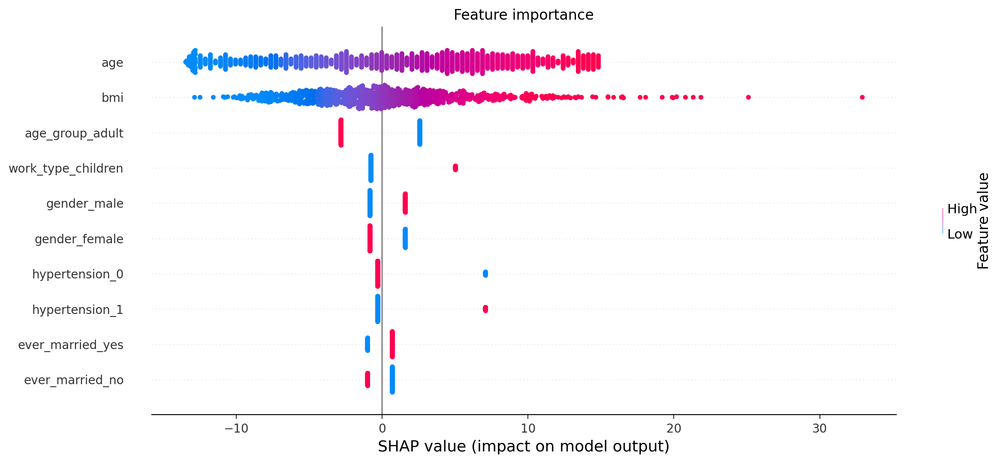

In [140]:
shap.summary_plot(
    shap_values,
    X_glc_test_tr,
    feature_names=feature_names_g,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()

fig.set_size_inches(14, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

- 4 Most important features by Ridge regression:
    - age
    - bmi
    - age_range (category 'adult') which raises some inconsistencies with EDA findings
    - work_type (category 'children')

In [141]:
glucose_pred_eval = pd.DataFrame(
    columns=[
        "Model",
        "R2-score",
        "RMSE",
    ]
)

glucose_pred_eval = append_rgss_metrics(
    glucose_pred_eval, y_glc_test, glucose_pred, "Ridge"
)

### XGBoost

In [142]:
boost_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor_glucose),
        (
            "regressor",
            xgb.XGBRegressor(objective="reg:squarederror", eval_metric="rmse"),
        ),
    ]
)

In [143]:
param_space = {
    "regressor__max_depth": list(range(2, 13)),
    "regressor__min_child_weight": list(range(1, 10)),
    "regressor__n_estimators": list(range(5, 500)),
    "regressor__learning_rate": [0.01, 0.05, 0.1, 0.2, 0.3],
    "regressor__gamma": [0, 0.25, 0.3, 0.5, 1.0],
    "regressor__colsample_bytree": [0.3, 0.4, 0.5, 0.7],
}

search_boost = RandomizedSearchCV(
    boost_pipe,
    param_distributions=param_space,
    scoring="r2",
    cv=6,
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_glc_train, y_glc_train)

print(
    "\033[1m" + "Best parameters: " + "\033[0m" + "{}".format(search_boost.best_params_)
)
print(
    "\033[1m"
    + "Best R-squared score: "
    + "\033[0m"
    + "{:0.3f}".format(search_boost.best_score_)
)

Best parameters: {'regressor__n_estimators': 436, 'regressor__min_child_weight': 3, 'regressor__max_depth': 5, 'regressor__learning_rate': 0.01, 'regressor__gamma': 0, 'regressor__colsample_bytree': 0.4}
Best R-squared score: 0.103


In [144]:
boost_pred = search_boost.predict(X_glc_test)

In [145]:
print(f"R-squared score for test set: {search_boost.score(X_glc_test, y_glc_test):.3f}")
print(
    f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_glc_test, boost_pred)):.3f}"
)

R-squared score for test set: 0.075
Root Mean Squared Error: 43.004


#### Model evaluation

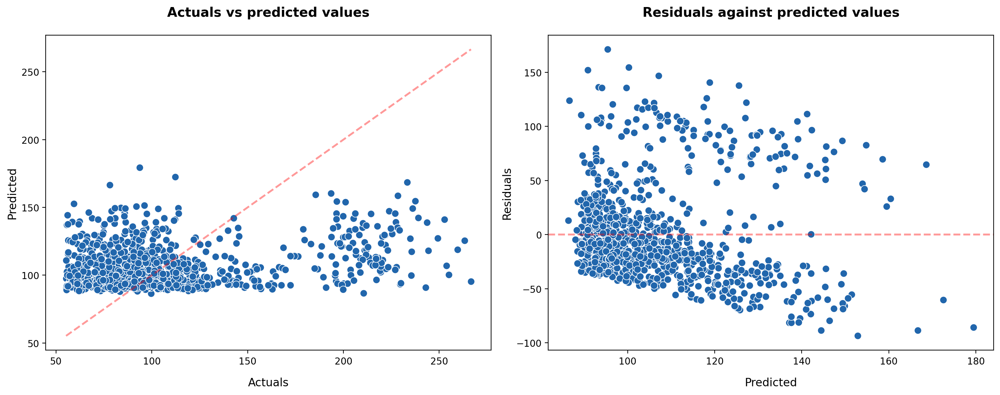

In [146]:
evaluate_model(y_glc_test, boost_pred)

**Insights**

- HP tuning helps to improve XGBoost results for train set but model performance on test set is lower than Ridge regression.
- Comparing actuals vs predicted for XGBoost, predicted values are clustered around the mean of avg glucose level. No predictions on higher end.
- The plot of residuals versus predicted values for XGBoost shows two patterns: variance for positive residuals decrease as predicted values increase and vice versa for negative residuals.

#### Feature importance

In [147]:
explainer_search = shap.TreeExplainer(
    search_boost.best_estimator_[-1],
    X_glc_train_tr,
    feature_names=feature_names_g,
)
shap_values = explainer_search(X_glc_test_tr)

 99%|===================| 1010/1022 [00:12<00:00]       

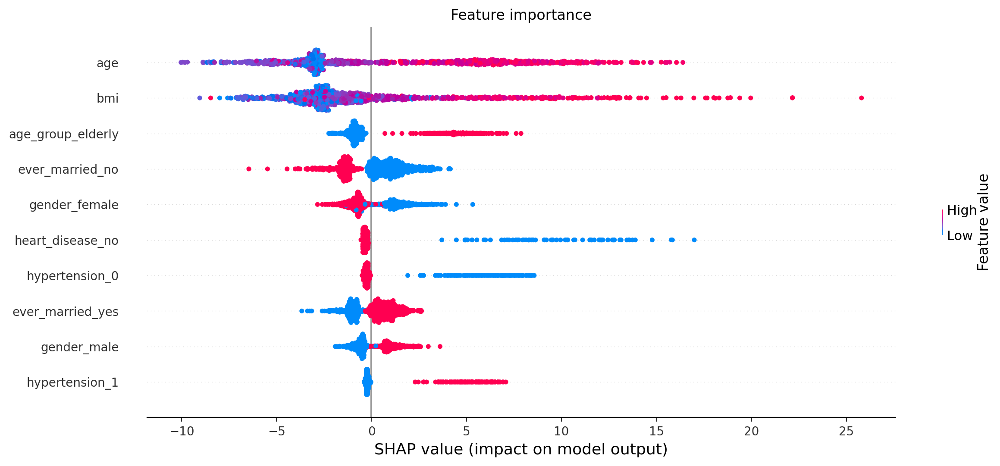

In [148]:
shap.summary_plot(
    shap_values,
    X_glc_test_tr,
    feature_names=feature_names_g,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()
fig.set_size_inches(14, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

**Insights**
- 4 Most important features by XGBoost regressor:
    - age
    - bmi
    - age_range (category 'elderly') 
    - ever_married (category 'no')

In [149]:
glucose_pred_eval = append_rgss_metrics(
    glucose_pred_eval, y_glc_test, boost_pred, "XGBoost"
)

### LightGBM

In [150]:
light_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor_glucose),
        ("regressor", lgb.LGBMRegressor(objective="regression", verbosity=-1)),
    ]
)

In [151]:
param_space = {
    "regressor__max_depth": list(range(2, 13)),
    "regressor__num_leaves": list(range(4, 100)),
    "regressor__min_data_in_leaf": list(range(5, 300)),
    "regressor__min_child_weight": list(range(1, 10)),
    "regressor__n_estimators": list(range(5, 500)),
    "regressor__learning_rate": [0.01, 0.1, 0.2, 0.3],
    "regressor__lambda_l1": [0, 0.01, 1, 2, 5, 7, 10, 50, 100],
}

search_light = RandomizedSearchCV(
    light_pipe,
    param_distributions=param_space,
    scoring="r2",
    cv=6,
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_glc_train, y_glc_train)

print(
    "\033[1m" + "Best parameters: " + "\033[0m" + "{}".format(search_light.best_params_)
)
print(
    "\033[1m"
    + "Best R-squared score: "
    + "\033[0m"
    + "{:0.3f}".format(search_light.best_score_)
)

[LightGBM] [Warning] min_data_in_leaf is set=102, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=102
[LightGBM] [Warning] lambda_l1 is set=7, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7
Best parameters: {'regressor__num_leaves': 87, 'regressor__n_estimators': 125, 'regressor__min_data_in_leaf': 102, 'regressor__min_child_weight': 4, 'regressor__max_depth': 2, 'regressor__learning_rate': 0.1, 'regressor__lambda_l1': 7}
Best R-squared score: 0.107


In [152]:
light_pred = search_light.predict(X_glc_test)

In [153]:
print(f"R-squared score for test set: {search_light.score(X_glc_test, y_glc_test):.3f}")
print(
    f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_glc_test, light_pred)):.3f}"
)

R-squared score for test set: 0.075
Root Mean Squared Error: 43.006


#### Model evaluation

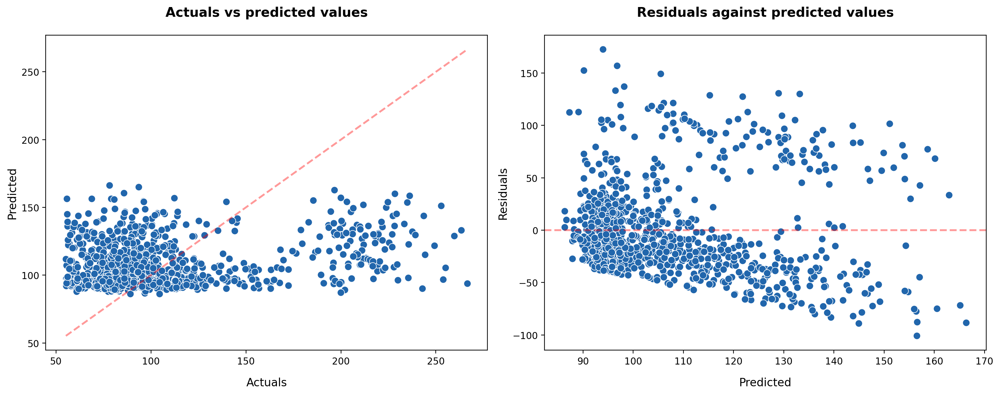

In [154]:
evaluate_model(y_glc_test, light_pred)

**Insights**

LightGBM shows very similar results to XGBoost.

#### Feature importance

In [155]:
explainer_search = shap.TreeExplainer(
    search_light.best_estimator_[-1],
    X_glc_train_tr,
    feature_names=feature_names_g,
)
shap_values = explainer_search(X_glc_test_tr)

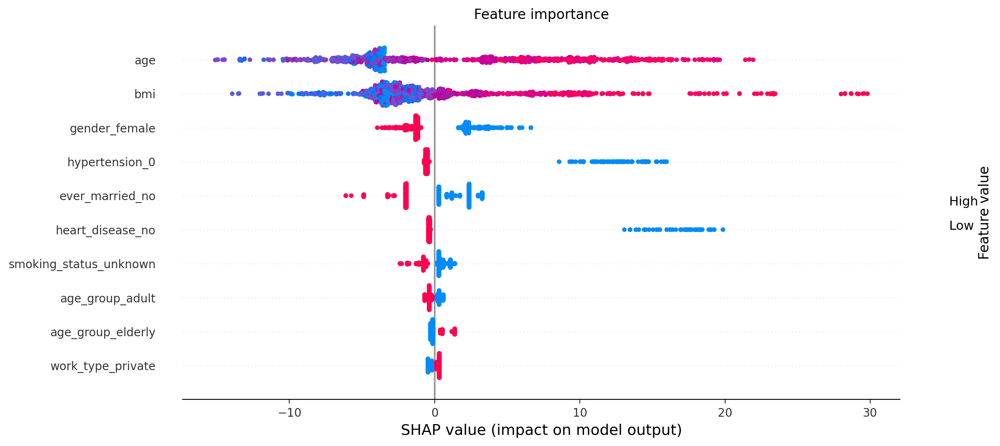

In [156]:
shap.summary_plot(
    shap_values,
    X_glc_test_tr,
    feature_names=feature_names_g,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()

fig.set_size_inches(14, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

**Insights**
- 4 Most important features by XGBoost regressor:
    - age
    - bmi
    - gnder (category 'female')
    - hypertension (category 'no')

In [157]:
glucose_pred_eval = append_rgss_metrics(
    glucose_pred_eval, y_glc_test, light_pred, "LightGBM"
)

### Avg glucose level prediction summary

Comparing metrics of 3 differenct regressors on test set:

In [158]:
glucose_pred_eval.set_index("Model").round(3)

,R2-score,RMSE
Model,,
Ridge,0.077,42.964
XGBoost,0.075,43.004
LightGBM,0.075,43.006


- Results of all three regressors (after hyperparameter tuning) are very similar.
- I chose Ridge regression for deployment as it provides a slightly higher R2-score (and slightly lower RMSE).

***

## BMI prediction

**Approach**

- BMI prediction I treat as a regression problem and use two evaluation metrics:
    - R2 score - the proportion of the variance in the dependent variable that is predictable from the independent variable(s)
    - Root mean squared error (RMSE) - the standard deviation of the residuals (prediction errors)
- Correlation coefficient analysis indicated that glucose level binning (grouping) could have more prediction power for BMI than avg glucose level as a continuous variable so I used custom transformer to fit this transformation into the pipeline.
- Also, after some experimentation I found that age binning (grouping) improves BMI prediction and used custom transformer to fit this transformation into the pipeline.

### Preprocessing

In [209]:
patient_info_b_ml = patient_info_h_ml.dropna()

In [210]:
y_bmi = patient_info_b_ml["bmi"]
X_bmi = patient_info_b_ml.drop(["bmi"], axis=1)

In [211]:
X_bmi_train, X_bmi_test, y_bmi_train, y_bmi_test = train_test_split(
    X_bmi, y_bmi, test_size=0.2, random_state=RANDOM
)

In [212]:
numeric_features_b = ['age', 'avg_glucose_level']
categorical_features_b = ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'residence_type', 'smoking_status']

In [213]:
categorical_transformer = Pipeline(steps=[("encoder", OneHotEncoder())])

numeric_transformer = Pipeline(
    steps=[
        ("scaler", MinMaxScaler()),
    ]
)

preprocessor_bmi = ColumnTransformer(
    transformers=[
        (
            "glucose_binner",
            GlucoseLevelBinner(
                columns=["age", "avg_glucose_level"], encoder=OneHotEncoder()
            ),
            ["age", "avg_glucose_level"],
        ),
        (
            "age_binner",
            AgeBinner(columns="age", encoder=OneHotEncoder(sparse=False)),
            ["age"],
        ),
        ("categorical", categorical_transformer, categorical_features_b),
        ("numeric", numeric_transformer, numeric_features_b),
    ]
)

### Model Selection

In [214]:
regressors_bmi = [
    ("Dummy Regressor", DummyRegressor(strategy="mean")),
    ("Ridge", Ridge()),
    ("Decicion Tree", DecisionTreeRegressor()),
    ("Random Forest", RandomForestRegressor()),
    ("XGBoost", xgb.XGBRegressor(objective="reg:squarederror", eval_metric="rmse")),
    ("Light GBM", lgb.LGBMRegressor(objective="regression", verbosity=-1)),
]

In [216]:
rgss_comparison = compare_regressors(
    regressors_bmi, preprocessor_bmi, X_bmi_train, y_bmi_train
)
rgss_comparison = rgss_comparison.set_index("Regressor")

rgss_comparison.style.format("{0:,.3f}").apply(
    highlight_max, num_to_highlight=3, subset=["R-squared"]
)

,Fit_time,R-squared,RMSE
Regressor,,,
Dummy Regressor,0.070,-0.001,7.805
Ridge,0.072,0.262,6.706
Decicion Tree,0.092,-0.609,9.860
Random Forest,1.375,0.169,7.101
XGBoost,0.510,0.096,7.407
Light GBM,0.154,0.221,6.880


In [207]:
round(patient_info_ml["bmi"].mean(), 2)

28.89

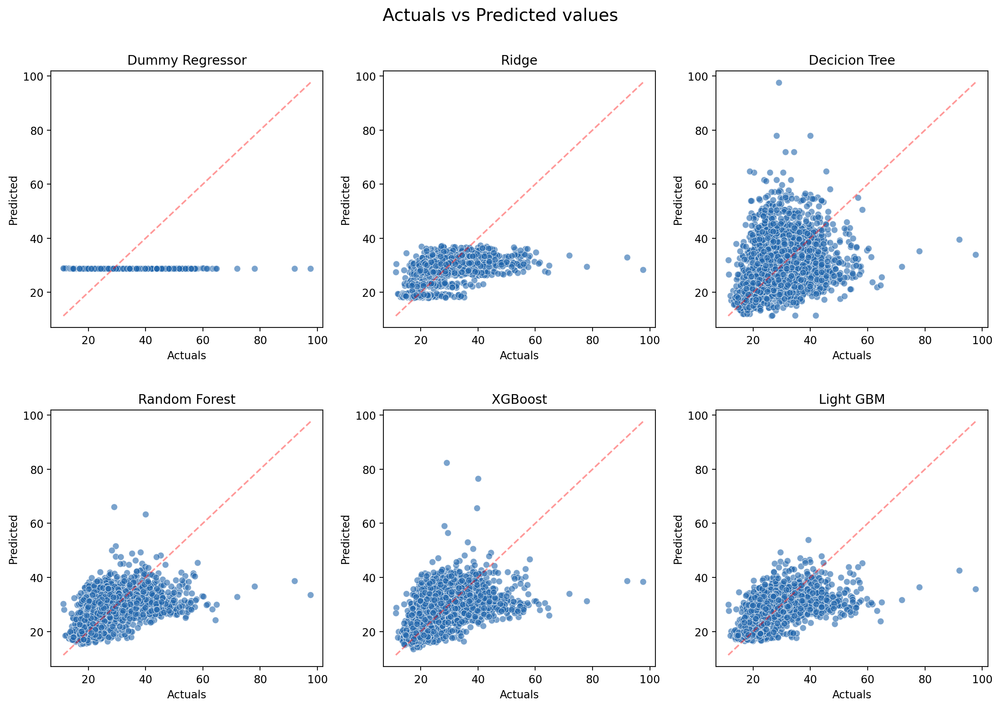

In [208]:
plot_reg_comparison(regressors_bmi, preprocessor_bmi, X_bmi_train, y_bmi_train)

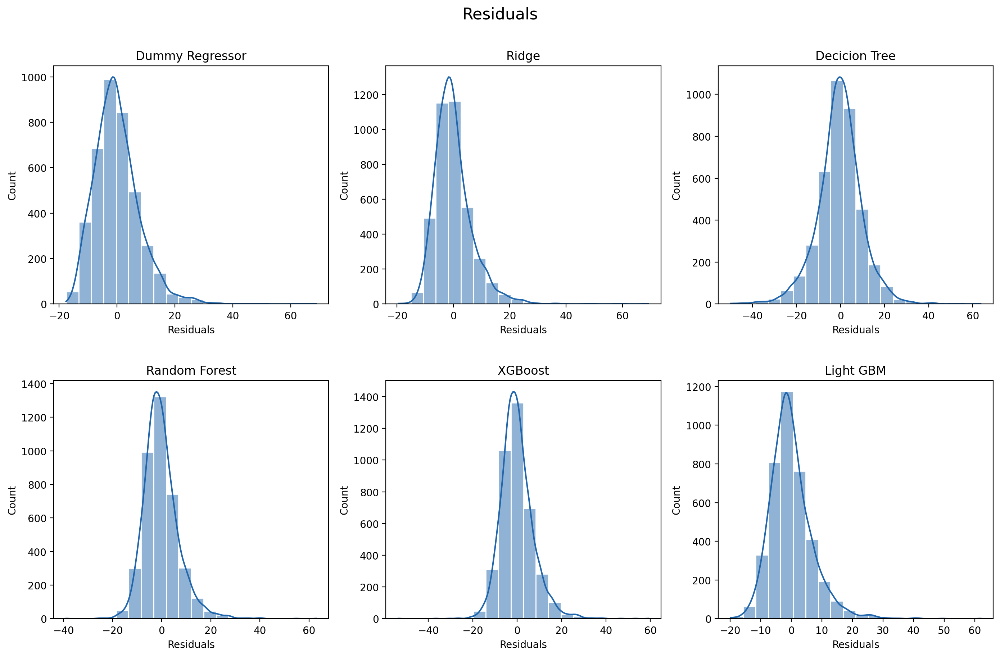

In [217]:
plot_residuals_comparison(
    regressors_bmi, preprocessor_bmi, X_bmi_train, y_bmi_train
)

**Insights**

- In general, it is obvious that features in this dataset are not sufficient for BMI prediction. R2 score indicates that in most cases only about 20% of the target variation could be explained by independent variables. Even though resuls are low, I continued with hyperparameter tuning and model analysis as per project requirements.
- Comparing actuals vs predicted, expectation is that all points would be close to diagonal line (predicted close to actual value), but in most models BMI predicted values are between 20-40 (clustered around the mean BMI)
- The range of residuals are high - RMSE for most models is almost third of mean BMI.
- Before hyperparameter tuning Logistic Regression and Ridge provide the highest R2 score (and the lowest RMSE accordingly)
- For HP tuning phase I chose:
    - Ridge regression as it has a slightly lower RMSE than Logistic regression;
    - LightGBM as it provides the best results out of all used ensemble algorithms
    - XGBoost because after some experimentation with HP tuning it provided better results than Random Forest (even though Random Forest showed better results without HP tuning)

### Ridge

In [172]:
ridge_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor_bmi),
        ("regressor", Ridge()),
    ]
)

In [173]:
param_space = {
    "regressor__alpha": [0.001, 0.005, 0.01, 0.05, 0.1, 1.0, 10.0, 15, 100.0],
    "regressor__solver": ["auto", "svd", "cholesky", "sag", "saga", "lsqr", "lbfgs"],
}

search_ridge = RandomizedSearchCV(
    ridge_pipe,
    param_distributions=param_space,
    scoring="r2",
    cv=6,
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_bmi_train, y_bmi_train)

print(
    "\033[1m" + "Best parameters: " + "\033[0m" + "{}".format(search_ridge.best_params_)
)
print(
    "\033[1m"
    + "Best R-squared score: "
    + "\033[0m"
    + "{:0.3f}".format(search_ridge.best_score_)
)

Best parameters: {'regressor__solver': 'svd', 'regressor__alpha': 10.0}
Best R-squared score: 0.262


In [174]:
bmi_pred = search_ridge.predict(X_bmi_test)

In [175]:
from sklearn.metrics import mean_squared_error

In [176]:
print(f"R-squared score for test set: {search_ridge.score(X_bmi_test, y_bmi_test):.3f}")
print(
    f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_bmi_test, bmi_pred)):.3f}"
)

R-squared score for test set: 0.263
Root Mean Squared Error: 6.869


#### Model evaluation

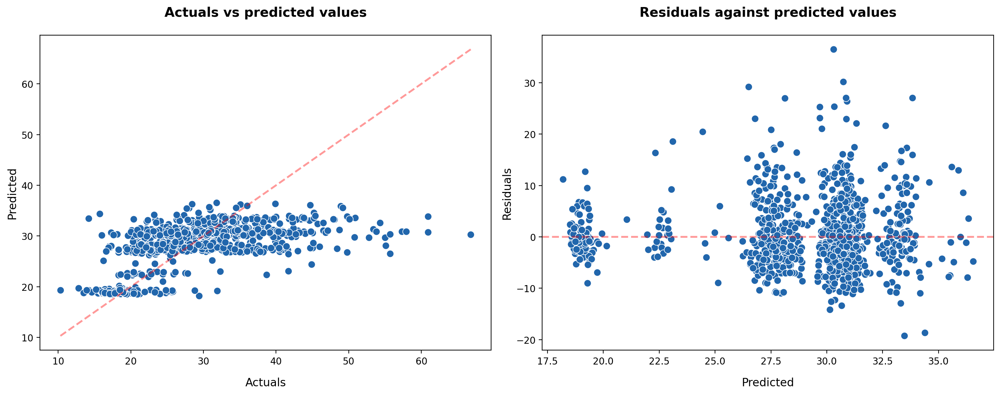

In [177]:
evaluate_model(y_bmi_test, bmi_pred)

**Insights**

- HP tuning doesn't help to improve Ridge results - R2 score remains the same.
- Comparing actuals vs predicted, predicted values are clustered between 20 and 40. 
- Residual variance increases as the predicted values increase and residuals form clusters around some values - this violates the assumption of constant error variance.

#### Feature importance

In [178]:
feature_names_bmi = get_feature_names(search_ridge, 3, numeric_features_b)

In [179]:
X_bmi_train_tr = search_ridge.best_estimator_[0].transform(X_bmi_train)
X_bmi_test_tr = search_ridge.best_estimator_[0].transform(X_bmi_test)

explainer_ridge = shap.LinearExplainer(
    search_ridge.best_estimator_[-1],
    X_bmi_train_tr,
    feature_names=feature_names_bmi,
)
shap_values = explainer_ridge(X_bmi_test_tr)

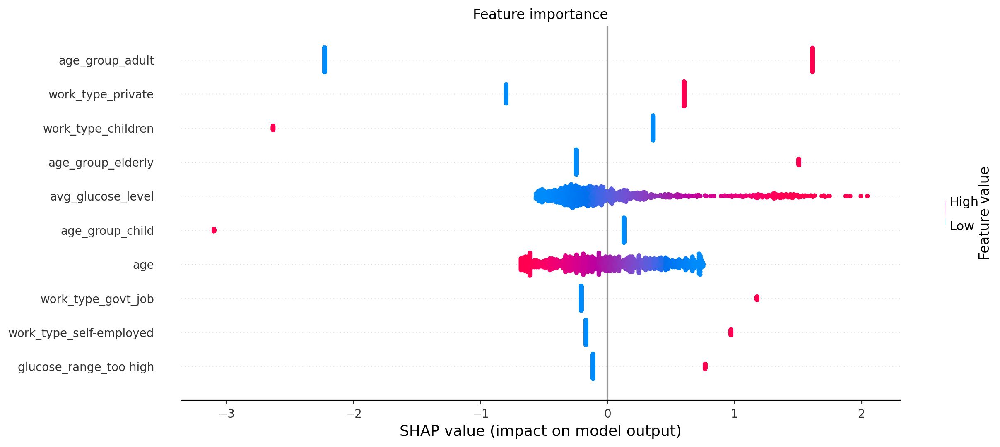

In [180]:
shap.summary_plot(
    shap_values,
    X_bmi_test_tr,
    feature_names=feature_names_bmi,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()

fig.set_size_inches(14, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

**Insights**

- 4 Most important features by Ridge regression:
    - age_range (category 'adult')
    - work_type (category 'private')
    - work_type (category 'children')
    - age_range (category 'elderly')

In [181]:
bmi_pred_eval = pd.DataFrame(
    columns=[
        "Model",
        "R2-score",
        "RMSE",
    ]
)

bmi_pred_eval = append_rgss_metrics(bmi_pred_eval, y_bmi_test, bmi_pred, "Ridge")

### XGBoost

In [182]:
boost_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor_bmi),
        (
            "regressor",
            xgb.XGBRegressor(objective="reg:squarederror", eval_metric="rmse"),
        ),
    ]
)

In [183]:
param_space = {
    "regressor__max_depth": list(range(2, 13)),
    "regressor__min_child_weight": list(range(1, 10)),
    "regressor__n_estimators": list(range(5, 500)),
    "regressor__learning_rate": [0.01, 0.05, 0.1, 0.2, 0.3],
    "regressor__gamma": [0, 0.25, 0.3, 0.5, 1.0],
    "regressor__colsample_bytree": [0.3, 0.4, 0.5, 0.7],
}

search_boost = RandomizedSearchCV(
    boost_pipe,
    param_distributions=param_space,
    scoring="r2",
    cv=6,
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_bmi_train, y_bmi_train)

print(
    "\033[1m" + "Best parameters: " + "\033[0m" + "{}".format(search_boost.best_params_)
)
print(
    "\033[1m"
    + "Best R-squared score: "
    + "\033[0m"
    + "{:0.3f}".format(search_boost.best_score_)
)

Best parameters: {'regressor__n_estimators': 436, 'regressor__min_child_weight': 3, 'regressor__max_depth': 5, 'regressor__learning_rate': 0.01, 'regressor__gamma': 0, 'regressor__colsample_bytree': 0.4}
Best R-squared score: 0.269


In [184]:
boost_pred = search_boost.predict(X_bmi_test)

In [185]:
print(f"R-squared score for test set: {search_boost.score(X_bmi_test, y_bmi_test):.3f}")
print(
    f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_bmi_test, boost_pred)):.3f}"
)

R-squared score for test set: 0.268
Root Mean Squared Error: 6.848


#### Model evaluation

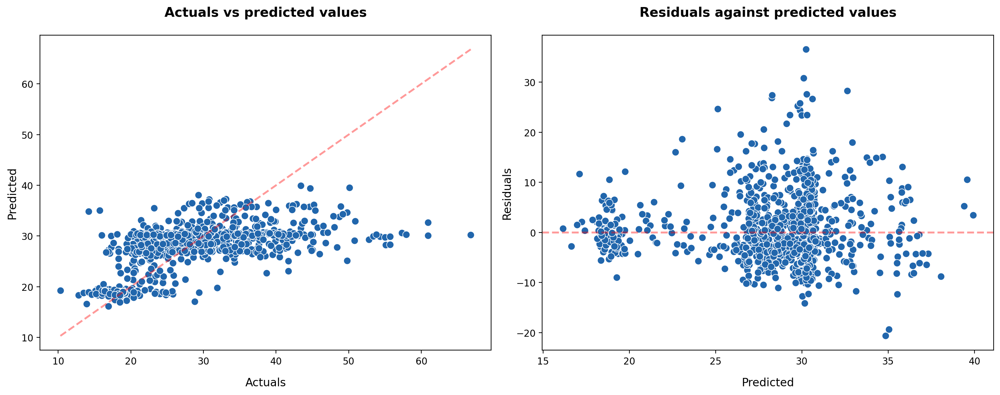

In [186]:
evaluate_model(y_bmi_test, boost_pred)

**Insights**

- HP tuning improves XGBoost results in predicting BMI.
- Comparing actuals vs predicted, XGBoost shows similar results to Ridge regression: predicted values are clustered between 20 and 40. 
- Residual distribution is more spreaded and doesn't form clusters like Ridge regression. However the trend in residual variance remains the same - it increases as the predicted values increase.

#### Feature importance

In [187]:
explainer_search = shap.TreeExplainer(
    search_boost.best_estimator_[-1],
    X_bmi_train_tr,
    feature_names=feature_names_bmi,
)
shap_values = explainer_search(X_bmi_test_tr)

 96%|=================== | 944/982 [00:13<00:00]       

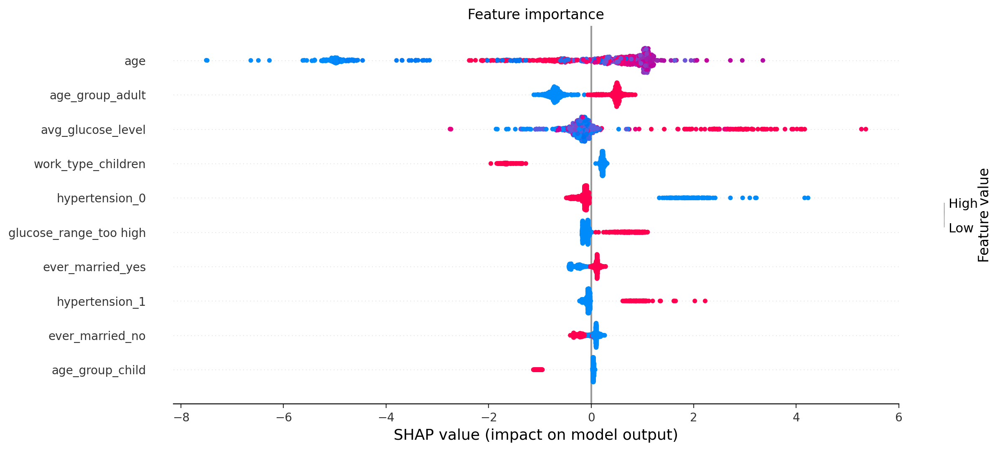

In [188]:
shap.summary_plot(
    shap_values,
    X_bmi_test_tr,
    feature_names=feature_names_bmi,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()
fig.set_size_inches(14, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

**Insights**

- 4 Most important features by XGBoost:
    - age
    - age_range (category 'adult')
    - avg_glucose_level
    - work_type (category 'children')

In [189]:
bmi_pred_eval = append_rgss_metrics(bmi_pred_eval, y_bmi_test, boost_pred, "XGBoost")

### LightGBM

In [190]:
light_pipe = Pipeline(
    steps=[
        ("preprocessor", preprocessor_bmi),
        ("regressor", lgb.LGBMRegressor(objective="regression", verbosity=-1)),
    ]
)

In [191]:
param_space = {
    "regressor__max_depth": list(range(2, 13)),
    "regressor__num_leaves": list(range(4, 100)),
    "regressor__min_data_in_leaf": list(range(5, 300)),
    "regressor__min_child_weight": list(range(1, 10)),
    "regressor__n_estimators": list(range(5, 500)),
    "regressor__learning_rate": [0.01, 0.1, 0.2, 0.3],
    "regressor__lambda_l1": [0, 0.01, 1, 2, 5, 7, 10, 50, 100],
}

search_light = RandomizedSearchCV(
    light_pipe,
    param_distributions=param_space,
    scoring="r2",
    cv=6,
    n_jobs=-1,
    random_state=RANDOM,
).fit(X_bmi_train, y_bmi_train)

print(
    "\033[1m" + "Best parameters: " + "\033[0m" + "{}".format(search_light.best_params_)
)
print(
    "\033[1m"
    + "Best R-squared score: "
    + "\033[0m"
    + "{:0.3f}".format(search_light.best_score_)
)

[LightGBM] [Warning] min_data_in_leaf is set=102, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=102
[LightGBM] [Warning] lambda_l1 is set=7, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7
Best parameters: {'regressor__num_leaves': 87, 'regressor__n_estimators': 125, 'regressor__min_data_in_leaf': 102, 'regressor__min_child_weight': 4, 'regressor__max_depth': 2, 'regressor__learning_rate': 0.1, 'regressor__lambda_l1': 7}
Best R-squared score: 0.275


In [192]:
# joblib.dump(search_light.best_estimator_, "models/bmi_regressor.pkl")

In [193]:
light_pred = search_light.predict(X_bmi_test)

In [194]:
print(f"R-squared score for test set: {search_light.score(X_bmi_test, y_bmi_test):.3f}")
print(
    f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_bmi_test, light_pred)):.3f}"
)

R-squared score for test set: 0.270
Root Mean Squared Error: 6.834


#### Model evaluation

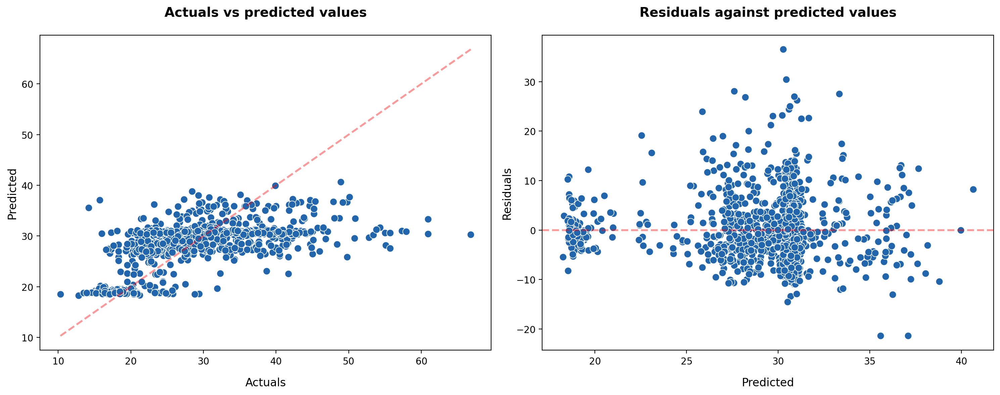

In [195]:
evaluate_model(y_bmi_test, light_pred)

**Insights**

- HP tuning improves a bit LightGBM results in predicting BMI. 
- Evaluation distributions (actuals vs predicted and residuals vs predicted) are very similar to what was provided by XGBoost.

#### Feature importance

In [196]:
explainer_search = shap.TreeExplainer(
    search_light.best_estimator_[-1],
    X_bmi_train_tr,
    feature_names=feature_names_bmi,
)
shap_values = explainer_search(X_bmi_test_tr)

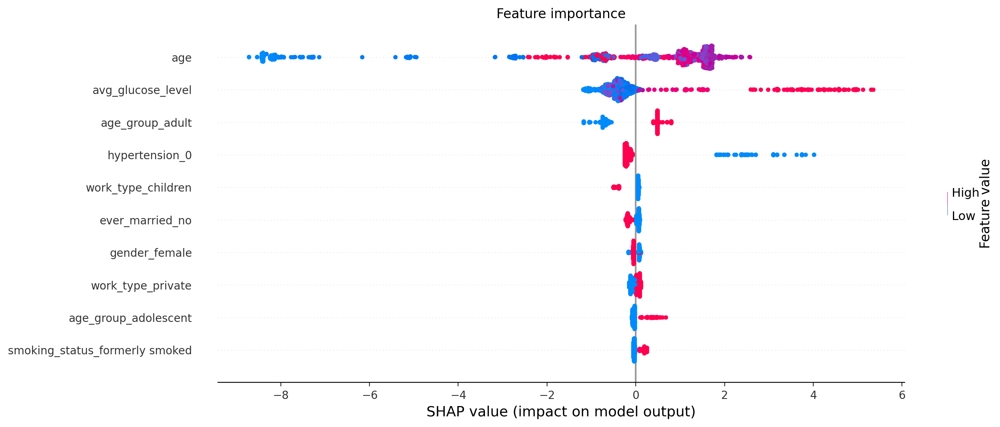

In [197]:
shap.summary_plot(
    shap_values,
    X_bmi_test_tr,
    feature_names=feature_names_bmi,
    max_display=10,
    show=False,
)

fig, ax = plt.gcf(), plt.gca()
fig.set_size_inches(14, 6)
ax.set_title("Feature importance", fontdict={"size": 12})
ax.tick_params(axis="both", which="major", labelsize=10)
ax.tick_params(axis="both", which="minor", labelsize=8)

**Insights**

- 4 Most important features by LightGBM:
    - age
    - avg_glucose_level
    - age_range (category 'adult')
    - hypertension (category 'no')

In [198]:
bmi_pred_eval = append_rgss_metrics(bmi_pred_eval, y_bmi_test, light_pred, "LightGBM")

### BMI prediction summary

Comparing metrics of 3 differenct regressors on test set:

In [199]:
bmi_pred_eval.set_index("Model").round(3)

,R2-score,RMSE
Model,,
Ridge,0.263,6.869
XGBoost,0.268,6.848
LightGBM,0.270,6.834


- Results of all three regressors (after hyperparameter tuning) are very similar.
- I chose LightGBM for deployment as it provides a slightly higher R2-score (and slightly lower RMSE).

## Summary

In this notebook, I provided a quite extensive and detailed analysis of ML results in order to choose the best performing algorithm for each target. To summarize what was discovered:

- Stroke prediction:
    - After HP tuning results of all three classifiers used to predict stroke are very similar. It might be the case that small dataset limits the usability of the advantages of the ensemble models. 
    - XGBoost provides a slightly higher recall than other models and it was chosen for deployment.
    - Most influential features for stroke prediction by XGBoost: age, bmi, avg_glucose_level
- Hypertension prediction:
    - While XGBoost provides high recall score hypertension prediction, F1 and precision scores are higher for LightGBM and Logistic regression.
    - I decided to choose LightGBM for deployment as XGBoost provided really high number of false positives which raised some concerns about model reliability.
    - Most influential features for hypertension prediction by LightGBM: age, bmi, smoking_status (category 'unknown')
- In general, it is obvious that features in this dataset are not sufficient for avg glucose level and BMI prediction as all models provided really poor results. Reframing these regression problems to classification might give better results but the output type would be a class instead of continuous value.
- Avg glucose level prediction:
    - Ridge regression provides the highest R2 score and was chosen for deployment.
    - Most influential features for avg glucose level prediction by Ridge: age, bmi, age_range (category 'adult')
- BMI prediction:
    - LightGBM provides the highest R2 score and was chosen for deployment.
    - Most influential features for BMI prediction by LightGBM: age, avg_glucose_level, age_range (category 'adult')

### Future Improvements

- Feature engineering
- More various ensemble algorithms
- Condensed approach to ML analysis